# Importing Libraries

In [1]:
import os 
import cv2
import matplotlib.pyplot as plt
import argparse
import numpy as np
import random as rnd
from PIL import Image
import glob
import scipy.io
import pandas as pd
from random import randint

import sklearn
from sklearn.cluster import KMeans
from collections import Counter
from sklearn.decomposition import PCA
import skimage.morphology
import time

In [2]:
plt.rcParams['figure.figsize'] = [15, 15]

# Importing and preparing images

In [3]:
SIMULE = scipy.io.loadmat('RADIOMREF.mat')
RADIOMREF1 = scipy.io.loadmat('RADIOMREF1.mat')
RADIOMREF2 = scipy.io.loadmat('RADIOMREF2.mat')
RADIOMREF3 = scipy.io.loadmat('RADIOMREF3.mat')

simule = SIMULE['RADIOMREF']
RadioImg1 = RADIOMREF1['RADIOMREF1']
RadioImg2 = RADIOMREF2['RADIOMREF2']
RadioImg3 = RADIOMREF3['RADIOMREF3']

In [4]:
print(RadioImg1.shape)

(1, 5)


In [5]:
print(RadioImg1[0, 0].shape)

(501, 501, 4)


In [4]:
def reshape_matfile(matFile) :
    return np.concatenate([np.expand_dims(np.array(matFile[0, i]), axis=0) for i in range(matFile.shape[1])])

In [5]:
RadioImg1 = reshape_matfile(RadioImg1)
RadioImg2 = reshape_matfile(RadioImg2)
RadioImg3 = reshape_matfile(RadioImg3)

In [0]:
RadioImg1.shape

(5, 501, 501, 4)

In [8]:
simule = reshape_matfile(simule)
print(simule.shape)

(15, 300, 300, 4)


# Preprocessing and Clustering

### Utility functions

In [10]:
def print_random(img) :
    dims = img.shape[3]
    
    x = randint(0, img.shape[1])    
    y = randint(0, img.shape[2])
    
    plt.figure(figsize=(10, 3), constrained_layout=True)
    for dim in range(dims):
        plt.subplot(1, dims, dim+1)
        plt.plot(range(img.shape[0]), img[:, x, y, dim])
    plt.suptitle("pixel behaviour at x={} and y={}".format(x, y), fontsize=16)
    #plt.suptitle('This is a somewhat long figure title')
    plt.show()
        

In [11]:
def get_dif_img(img) :
    res = np.zeros((img.shape[0]-1, img.shape[1], img.shape[2], img.shape[3]))
    for i in range(res.shape[0]) :
        res[i, :, :, :] = img[i+1, :, :, :] - img[i, :, :, :]
    return res

In [12]:
def get_variance(img) :
    means = np.mean(img, axis=0)
    variance = np.sum((img-means)**2, axis=0) / img.shape[0]
    return variance

In [13]:
def find_vector_set(img):
    dims = img.shape
    vector_set = np.zeros((dims[1]*dims[2], dims[0]*dims[3]))
    for i in range(dims[1]) :
        for j in range(dims[2]) :
            for k in range(dims[3]) :
                for l in range(dims[0]) :
                    vector_set[i*dims[2]+j, k*dims[0]+l] = img[l, i, j, k]
    return vector_set

In [14]:
def clustering(FVS, dims, components):
    kmeans = KMeans(components, verbose = 0, random_state=123)
    kmeans.fit(FVS)
    output = kmeans.predict(FVS)
    #count  = Counter(output)
    
    labels= kmeans.labels_
    centroids = kmeans.cluster_centers_
    
    cluster_map = np.zeros((dims[1], dims[2]))
 
    for i in range(dims[1]) :
        for j in range(dims[2]) :
            cluster_map[i, j] = output[dims[2]*i+j]
                    
    return cluster_map, labels, centroids

In [15]:
def print_random_cluster(img, cluster_map) :
    dims = img.shape[3]
    
    x = randint(0, img.shape[1]-1)    
    y = randint(0, img.shape[2]-1)
    
    plt.figure(figsize=(10, 3), constrained_layout=True)
    for dim in range(dims):
        plt.subplot(1, dims, dim+1)
        plt.plot(range(img.shape[0]), img[:, x, y, dim])
    plt.suptitle("pixel behaviour at x={} and y={}, cluster {}".format(x, y, cluster_map[x, y]), fontsize=16)
    #plt.suptitle('This is a somewhat long figure title')
    plt.show()
        

In [16]:
def print_selected_cluster(img, cluster_map, cluster) :
    img = img[:, cluster_map == cluster, :]
    dims = img.shape[-1]
    
    x = randint(0, img.shape[1]-1)   
    
    plt.figure(figsize=(10, 3), constrained_layout=True)
    for dim in range(dims):
        plt.subplot(1, dims, dim+1)
        plt.plot(range(img.shape[0]), img[:, x, dim])
    plt.suptitle("pixel behaviour cluster {}".format(cluster), fontsize=16)
    #plt.suptitle('This is a somewhat long figure title')
    plt.show()
        

### The work

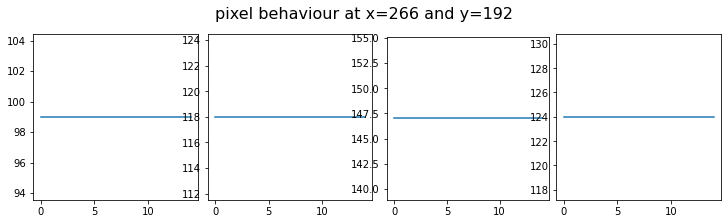

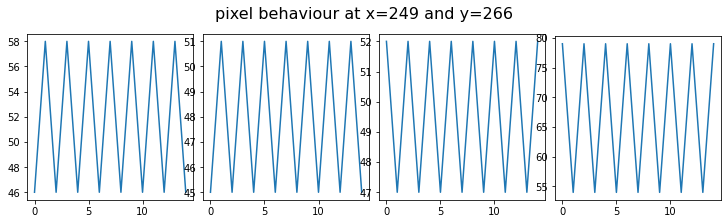

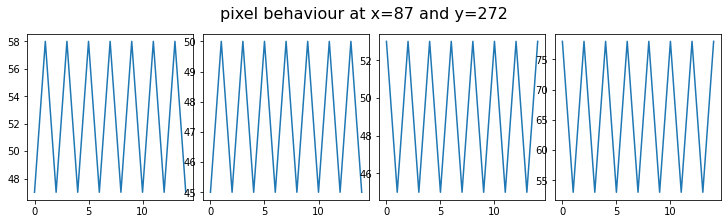

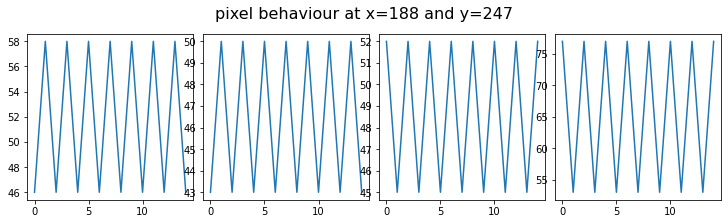

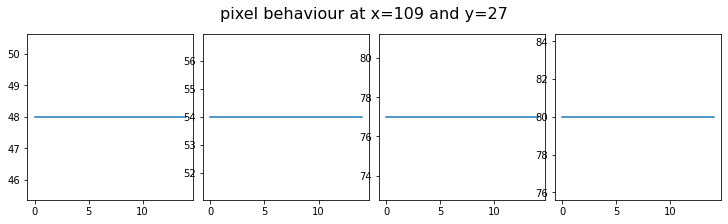

...

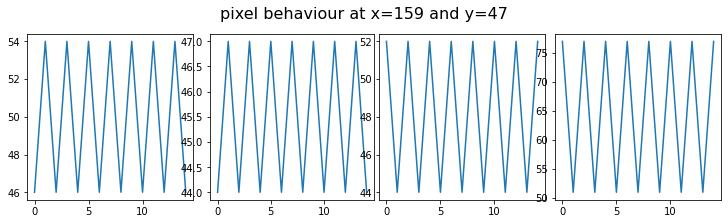

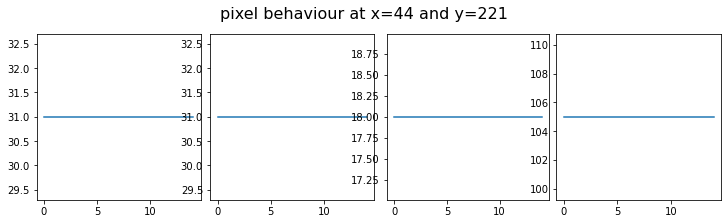

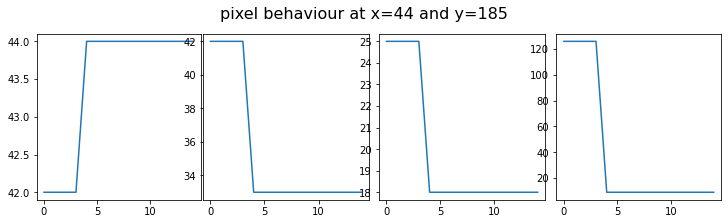

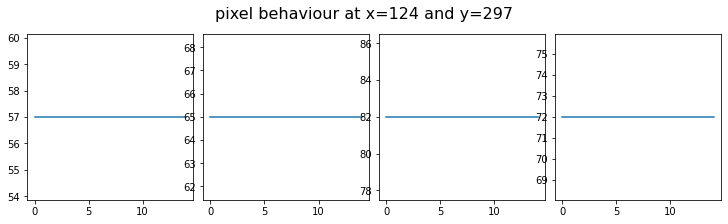

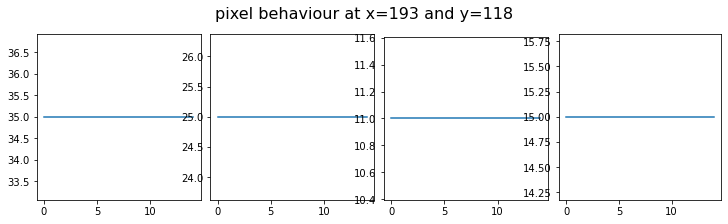

In [0]:
for i in range(20) :
    print_random(simule)

In [0]:
difs = get_dif_img(simule)

In [0]:
variance = get_variance(simule)

In [19]:
FVS = find_vector_set(difs)
print(FVS.shape)

(90000, 56)


In [0]:
FVS_variance = find_vector_set(np.expand_dims(variance, axis=0))

In [21]:
np.expand_dims(variance, axis=0).shape

(1, 300, 300, 4)

In [0]:
cluster_map, _, _ = clustering(FVS, simule.shape, components=4)

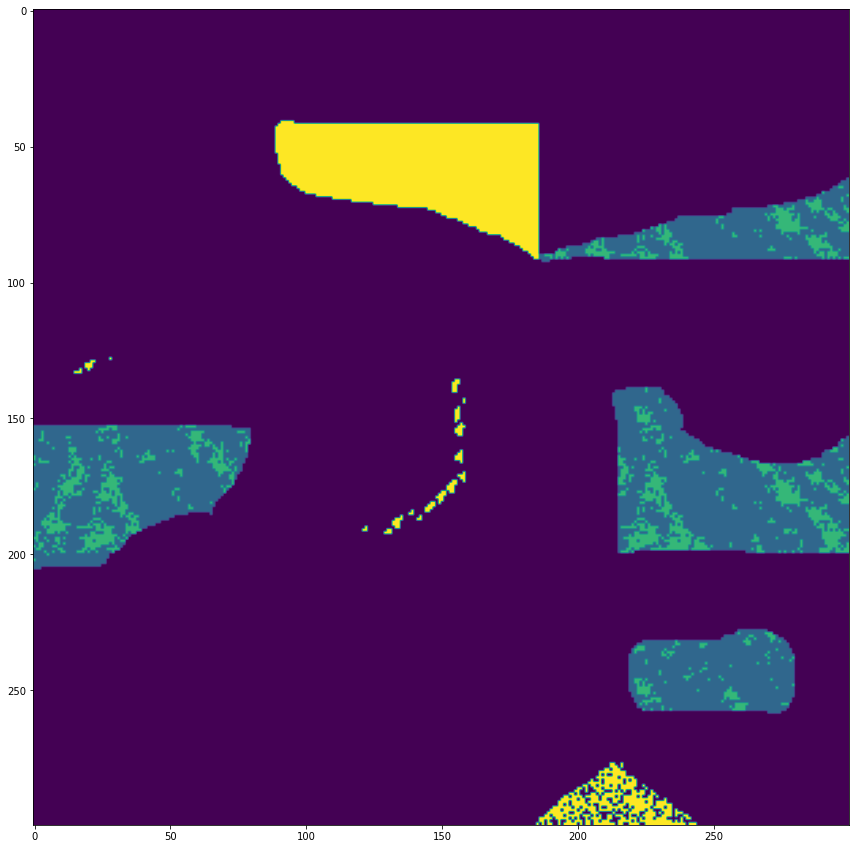

In [24]:
plt.imshow(cluster_map)

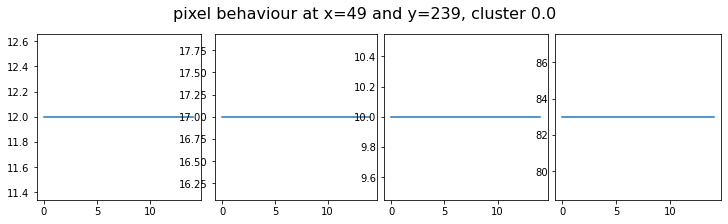

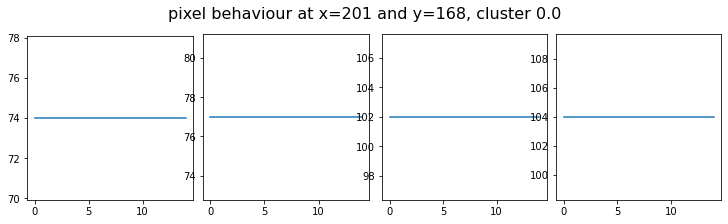

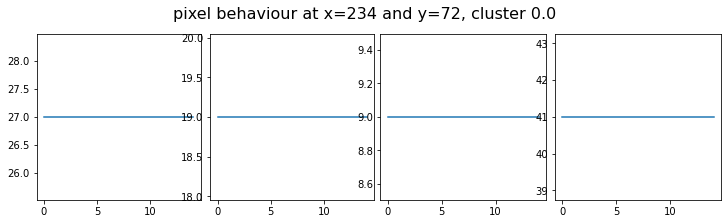

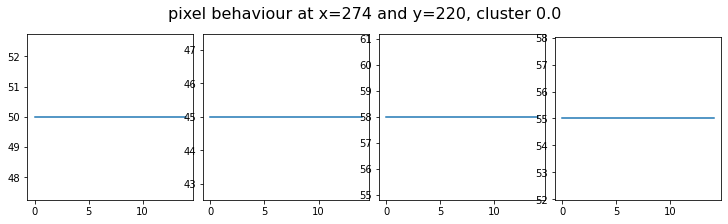

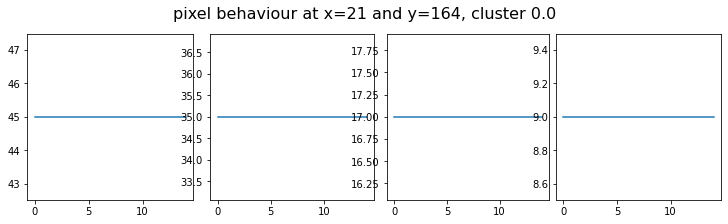

...

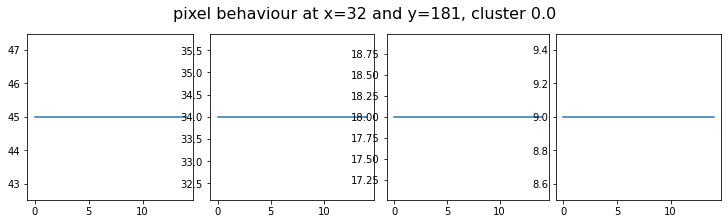

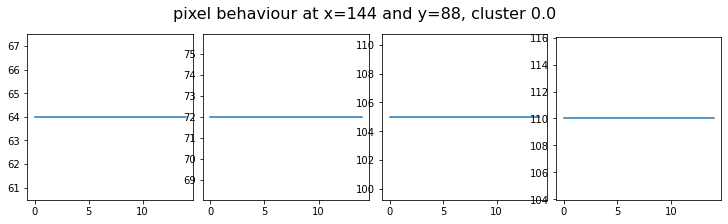

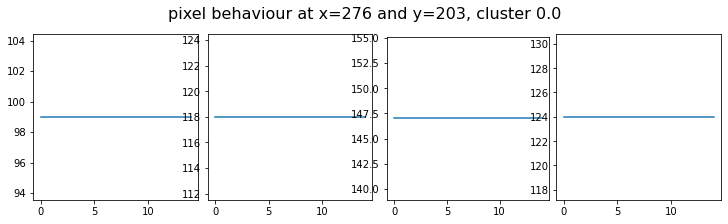

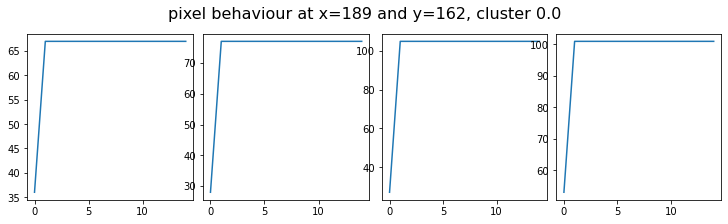

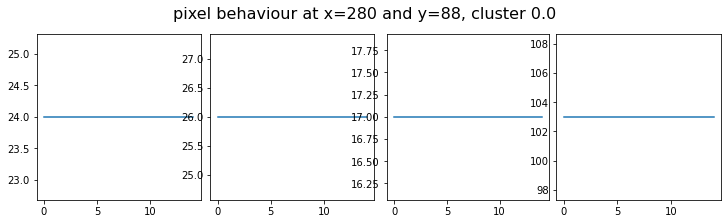

In [0]:
for i in range(20) :
    print_random_cluster(simule, cluster_map)

à essayer : variance - homogeinité - entropie

Variance

In [0]:
cluster_map, _, _ = clustering(FVS_variance, simule.shape, components=5)

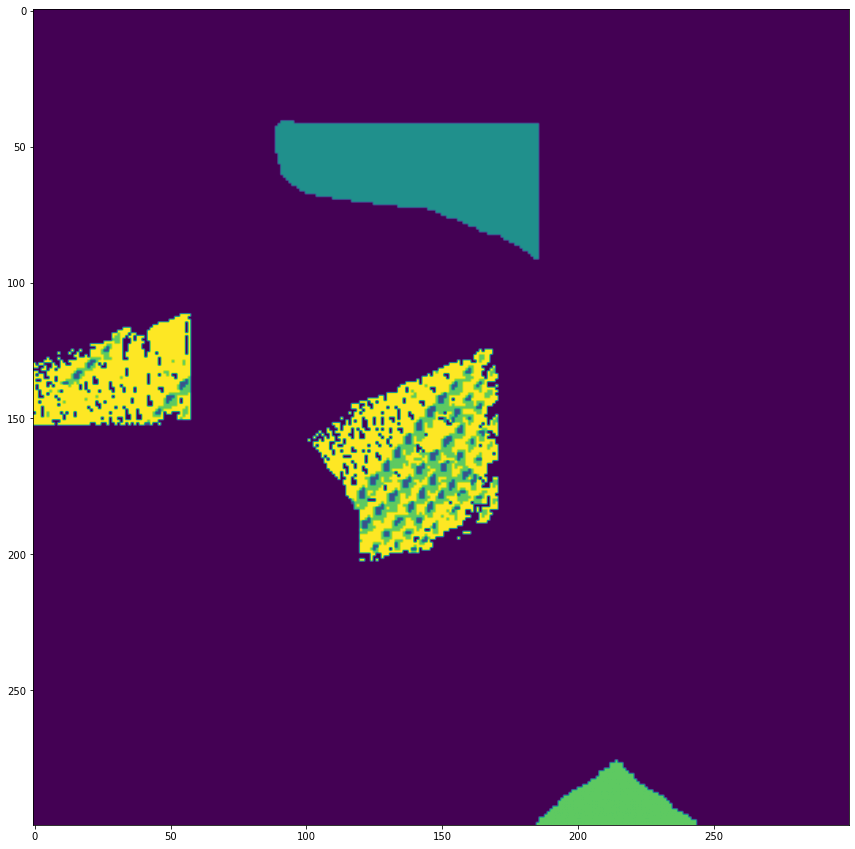

In [0]:
plt.imshow(cluster_map)

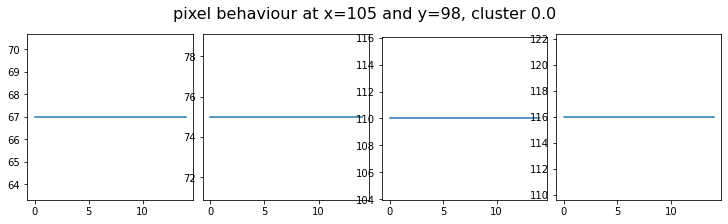

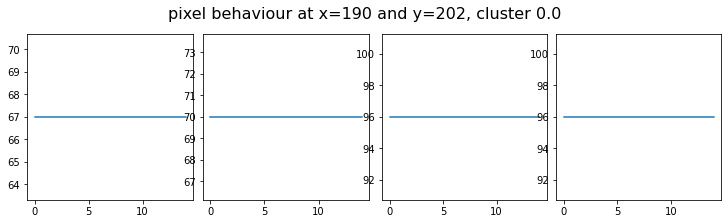

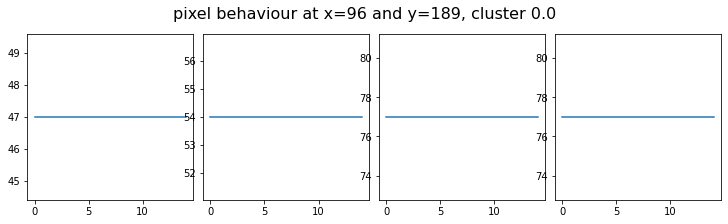

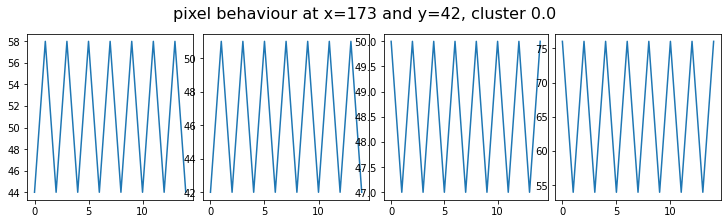

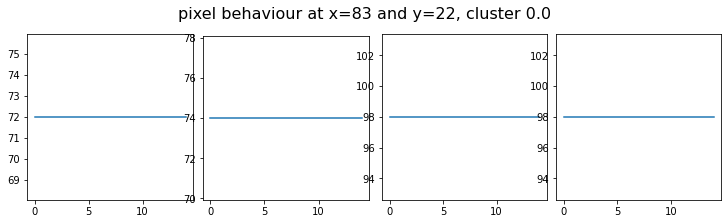

...

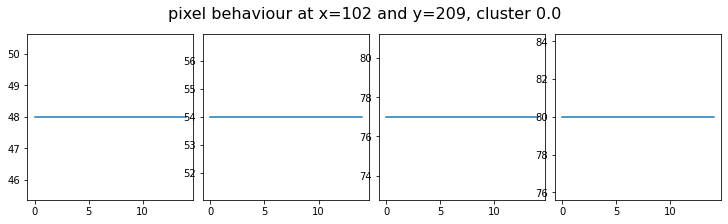

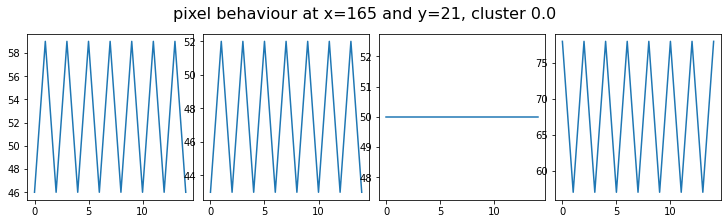

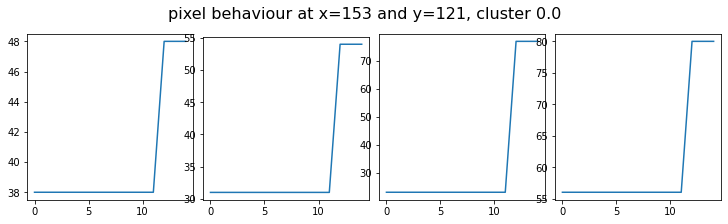

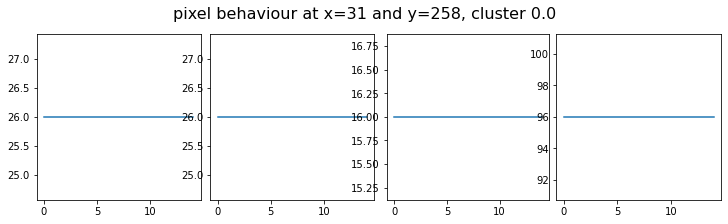

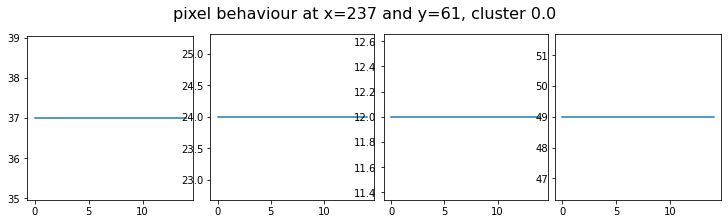

In [0]:
for i in range(20) :
    print_random_cluster(simule, cluster_map)

Difference + variance

In [0]:
dif_var = np.concatenate([FVS, FVS_variance], axis=1)

In [0]:
FVS_variance.shape

(90000, 4)

In [0]:
dif_var.shape

(90000, 60)

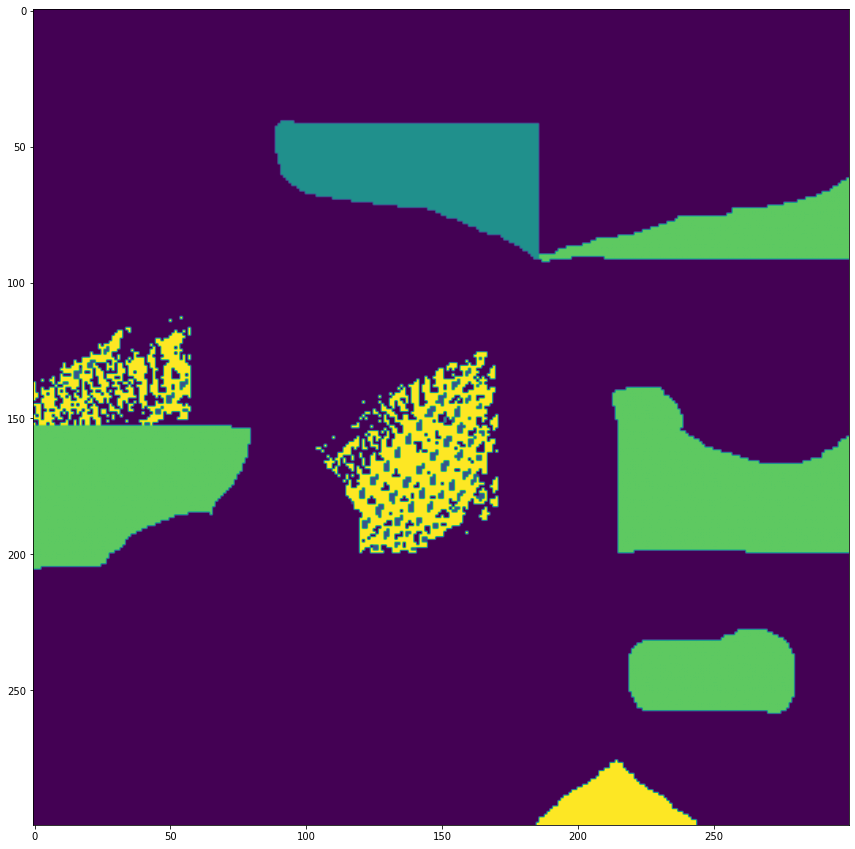

In [28]:
cluster_map, _, _ = clustering(dif_var, simule.shape, components=5)
plt.imshow(cluster_map)

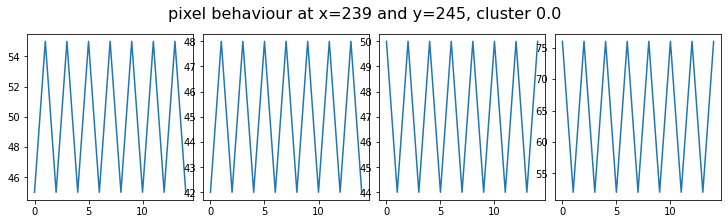

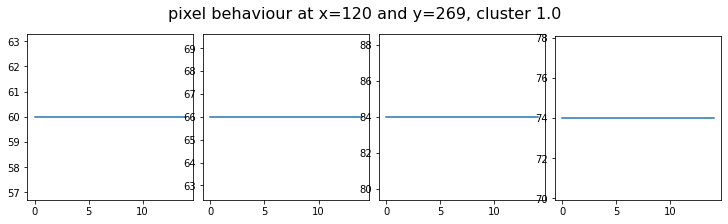

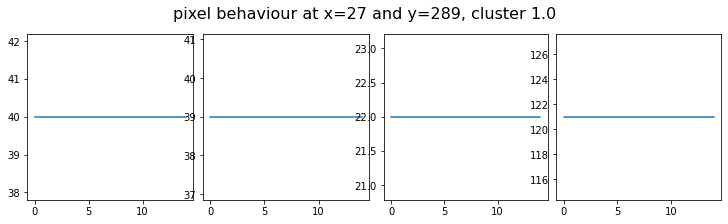

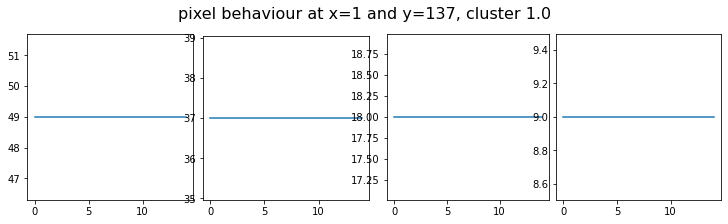

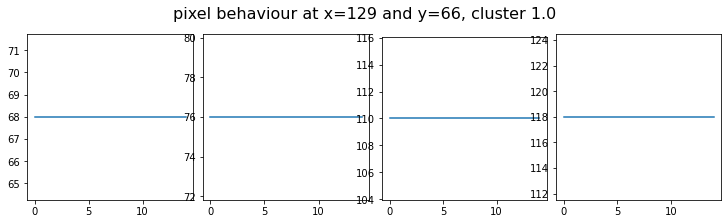

...

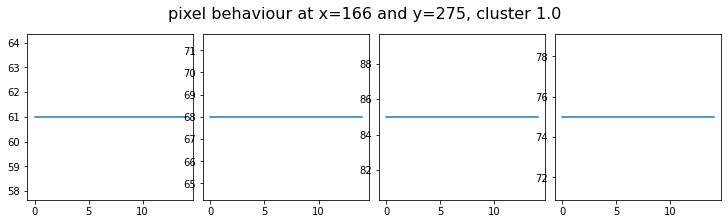

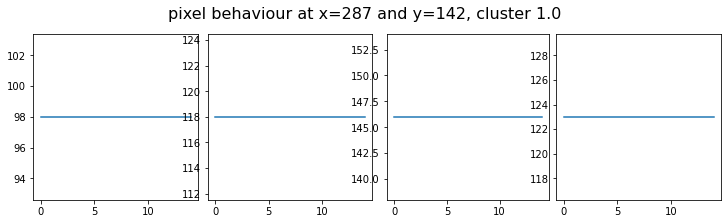

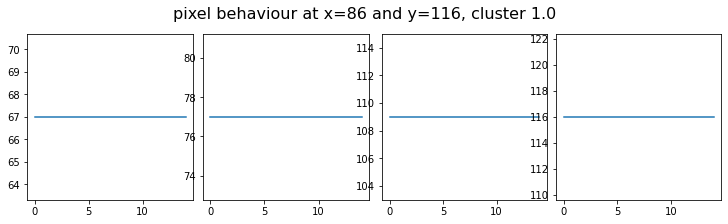

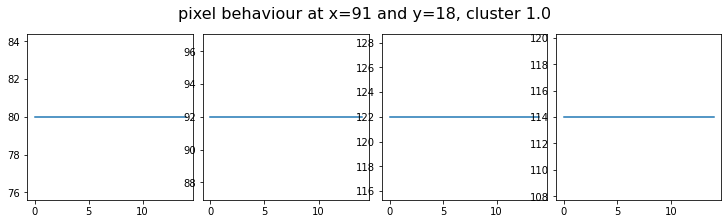

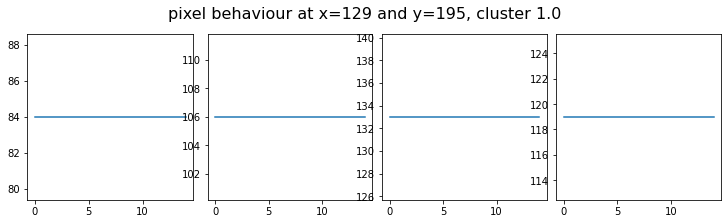

In [0]:
for i in range(20) :
    print_random_cluster(simule, cluster_map)

In [29]:
unique, counts = np.unique(cluster_map, return_counts=True)
print (np.asarray((unique, counts)).T.astype(int))

[[    0 72718]
 [    1   344]
 [    2  3176]
 [    3 10048]
 [    4  3714]]


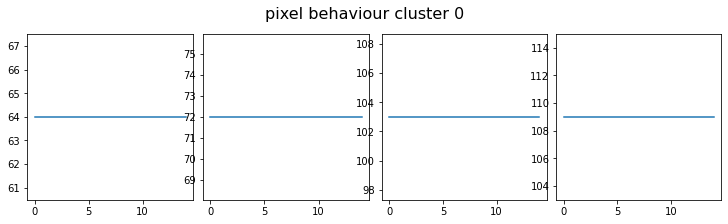

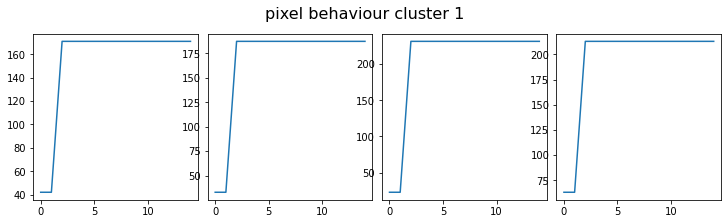

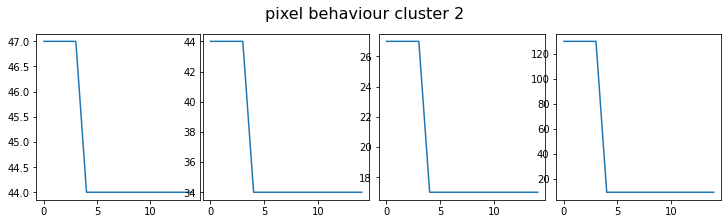

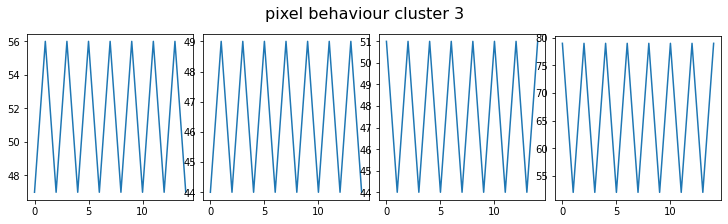

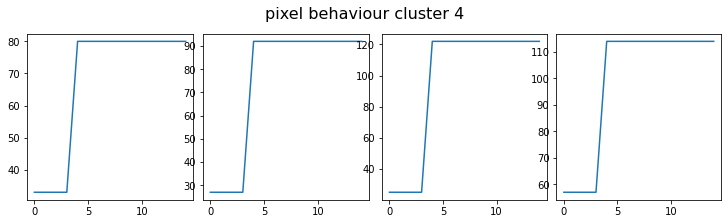

In [40]:
for i in range(5) :
  print_selected_cluster(simule, cluster_map, i)

In [0]:
# 0 : stable, 1 : periodic, 2 : sudden

mapped_clusters = {0:0, 1:2, 2:2, 3:1, 4:2}
    
dif_var_map = np.vectorize(mapped_clusters.get)(cluster_map)

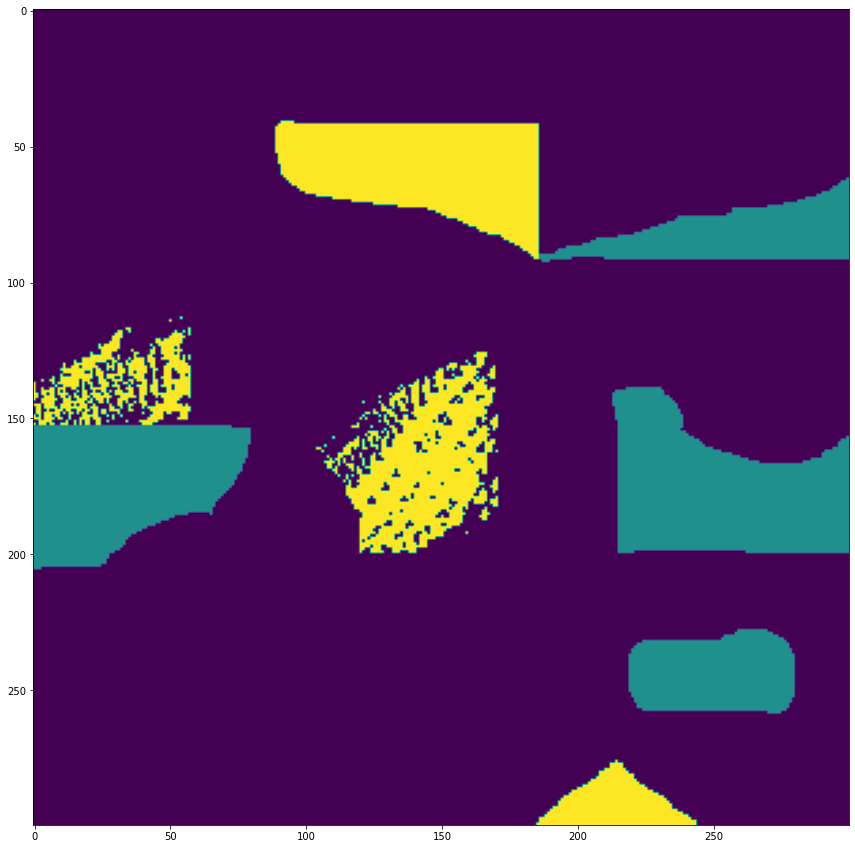

In [31]:
plt.imshow(dif_var_map)

Entropy

In [0]:
def SampEn(U, m, r):
    """Compute Sample entropy"""
    def _maxdist(x_i, x_j):
        return max([abs(ua - va) for ua, va in zip(x_i, x_j)])

    def _phi(m):
        x = [[U[j] for j in range(i, i + m - 1 + 1)] for i in range(N - m + 1)]
        C = [len([1 for j in range(len(x)) if i != j and _maxdist(x[i], x[j]) <= r]) for i in range(len(x))]
        return sum(C)

    N = len(U)
    return -np.log(_phi(m+1) / _phi(m))

In [0]:
def get_entropy(img) :
    entropie = np.zeros(img.shape[1:])
    for i in range(img.shape[1]):
        for j in range(img.shape[2]):
            for l in range(img.shape[3]):
                entropie[i, j, l] = SampEn(simule[:, i, j, l], 2, 3)
    return entropie

In [0]:
entropie = get_entropy(simule)

<ipython-input-153-e15b42d4a182>:4: RuntimeWarning: overflow encountered in ubyte_scalars
  return max([abs(ua - va) for ua, va in zip(x_i, x_j)])


In [0]:
import pickle as pkl
pkl.dump(entropie, open( "entropie.p", "wb" )) #it takes a lot of time to calculate so we save it

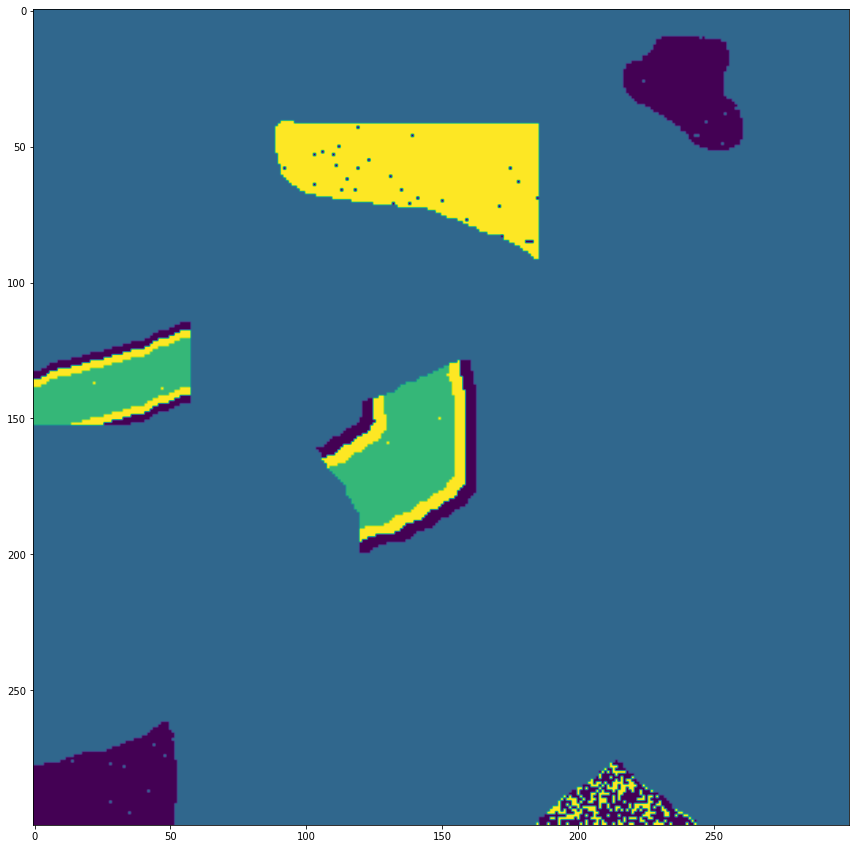

In [49]:
import pickle as pkl
entropie = pkl.load(open("entropie.p", "rb" ))
FVS_entropie = find_vector_set(np.expand_dims(entropie, axis=0))
cluster_map, _, _ = clustering(FVS_entropie, simule.shape, components=4)
plt.imshow(cluster_map)

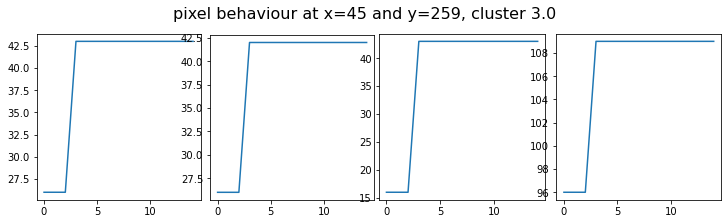

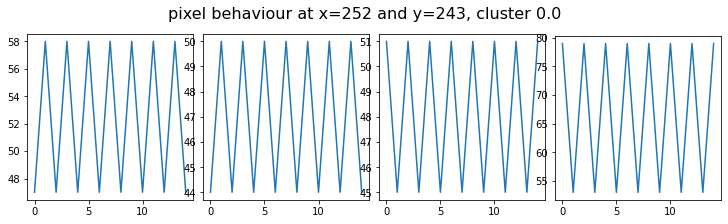

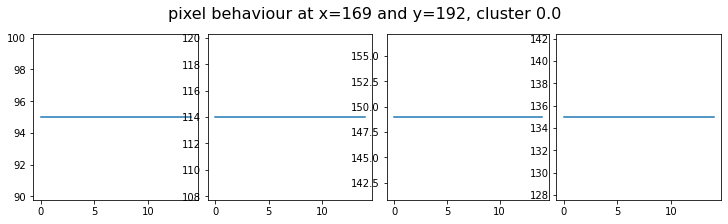

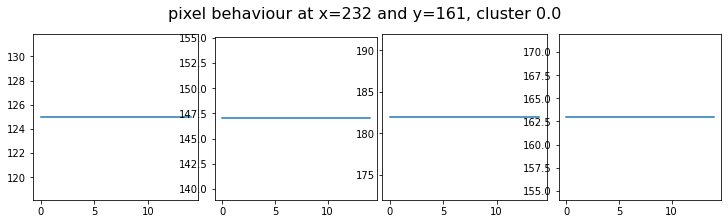

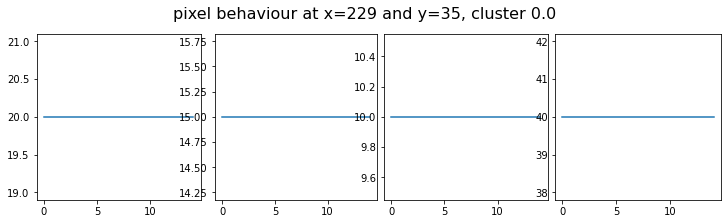

...

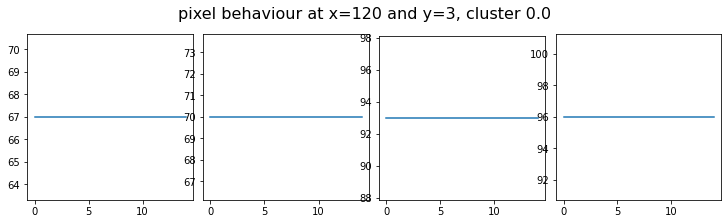

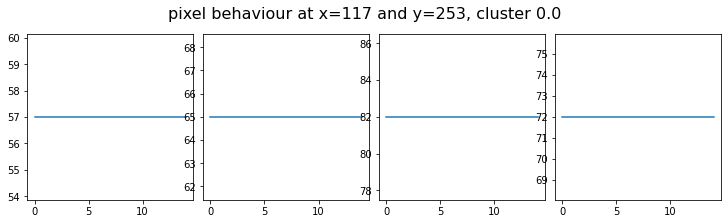

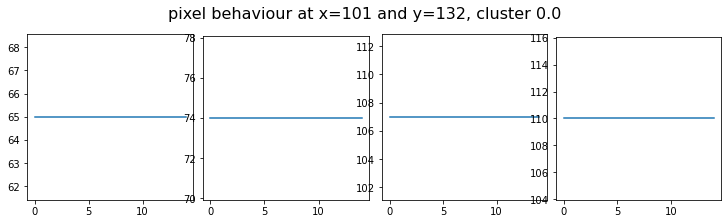

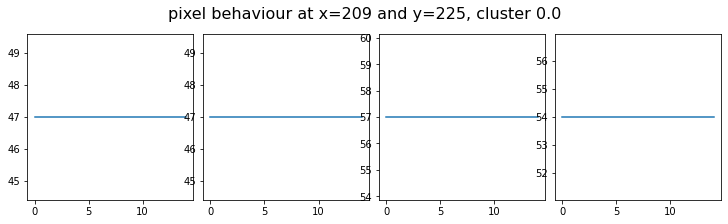

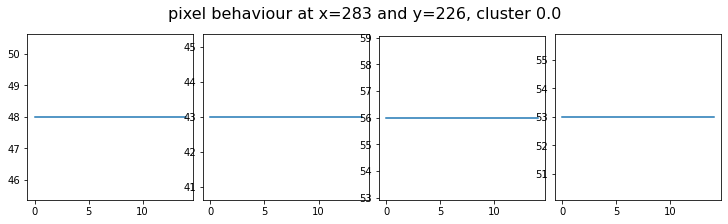

In [0]:
for i in range(20) :
    print_random_cluster(simule, cluster_map)

In [0]:
entr_map = cluster_map

In [0]:
%timeit SampEn(simule[:, 0, 0, 0], 2, 3)

2.43 ms ± 303 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


Trying homogeinity, it is however a prohibitively expensive operation

In [0]:
import pyhomogeneity as hg
%timeit result = hg.snht_test(simule[:, 0, 0, 0])
print(result)

D:\virtualenvs\python\virtualenvs\change-detection\lib\site-packages\pyhomogeneity\pyhomogeneity.py:81: RuntimeWarning: invalid value encountered in true_divide
  z1 = ((s - k * x.mean()) / x.std(ddof=1)) / k
D:\virtualenvs\python\virtualenvs\change-detection\lib\site-packages\pyhomogeneity\pyhomogeneity.py:82: RuntimeWarning: invalid value encountered in true_divide
  z2 = ((rs - k[::-1] * x.mean()) / x.std(ddof=1)) / (n - k)
D:\virtualenvs\python\virtualenvs\change-detection\lib\site-packages\pyhomogeneity\pyhomogeneity.py:143: RuntimeWarning: invalid value encountered in greater
  p_val = (res[:,0] > stat).sum() / sim


3.06 s ± 129 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=81.0, mu2=81.0))


In [0]:
def print_random_hg(img) :
    dims = img.shape[3]
    
    x = randint(0, img.shape[1]-1)    
    y = randint(0, img.shape[2]-1)
    
    print(hg.pettitt_test(simule[:, x, y, 0]))
    print(hg.pettitt_test(simule[:, x, y, 1]))
    print(hg.pettitt_test(simule[:, x, y, 2]))
    print(hg.pettitt_test(simule[:, x, y, 3]))
    
    plt.figure(figsize=(10, 3), constrained_layout=True)
    for dim in range(dims):
        plt.subplot(1, dims, dim+1)
        plt.plot(range(img.shape[0]), img[:, x, y, dim])
    plt.suptitle("pixel behaviour at x={} and y={}".format(x, y), fontsize=16)
    #plt.suptitle('This is a somewhat long figure title')
    plt.show()
        

Pettitt_Test(h=False, cp=1, p=1.0, U=7.0, avg=mean(mu1=46.0, mu2=52.5))
Pettitt_Test(h=False, cp=1, p=1.0, U=7.0, avg=mean(mu1=43.0, mu2=48.5))
Pettitt_Test(h=False, cp=1, p=1.0, U=7.0, avg=mean(mu1=50.0, mu2=51.0))
Pettitt_Test(h=False, cp=1, p=1.0, U=7.0, avg=mean(mu1=78.0, mu2=69.0))


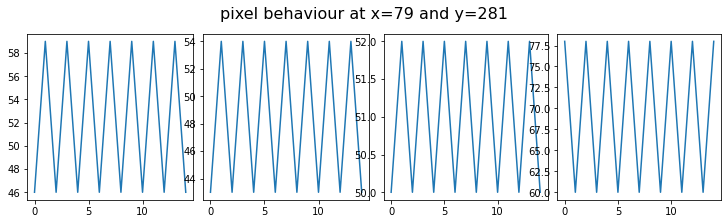

Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=57.0, mu2=57.0))
Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=65.0, mu2=65.0))
Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=82.0, mu2=82.0))
Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=72.0, mu2=72.0))


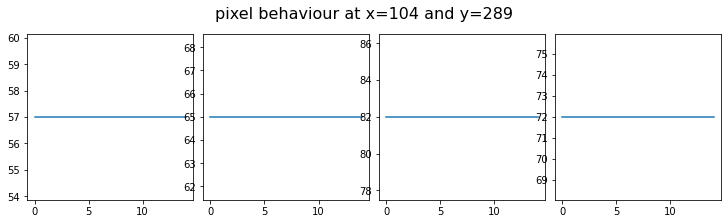

Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=84.0, mu2=84.0))
Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=106.0, mu2=106.0))
Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=133.0, mu2=133.0))
Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=119.0, mu2=119.0))


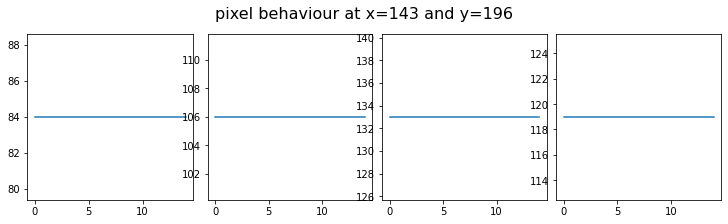

Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=43.0, mu2=43.0))
Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=26.0, mu2=26.0))
Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=13.0, mu2=13.0))
Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=14.0, mu2=14.0))


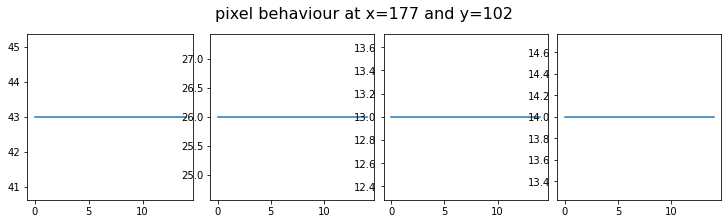

Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=67.0, mu2=67.0))
Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=70.0, mu2=70.0))
Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=93.0, mu2=93.0))
Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=96.0, mu2=96.0))


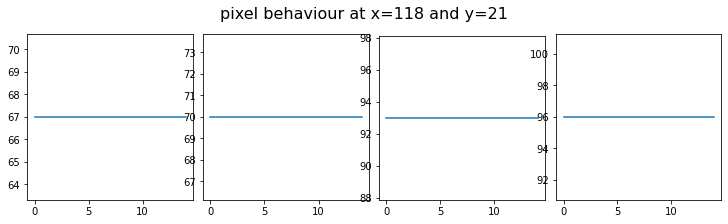

Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=49.0, mu2=49.0))
Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=47.0, mu2=47.0))
Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=57.0, mu2=57.0))
Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=54.0, mu2=54.0))


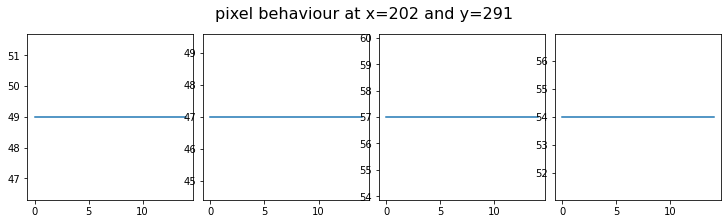

Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=58.0, mu2=58.0))
Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=64.0, mu2=64.0))
Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=82.0, mu2=82.0))
Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=71.0, mu2=71.0))


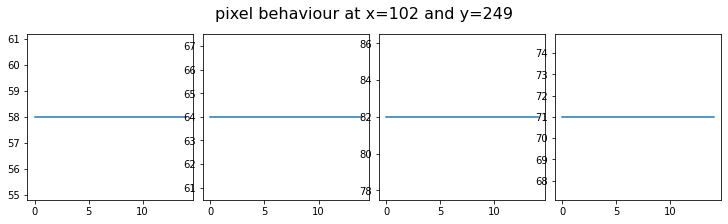

Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=74.0, mu2=74.0))
Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=87.0, mu2=87.0))
Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=125.0, mu2=125.0))
Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=129.0, mu2=129.0))


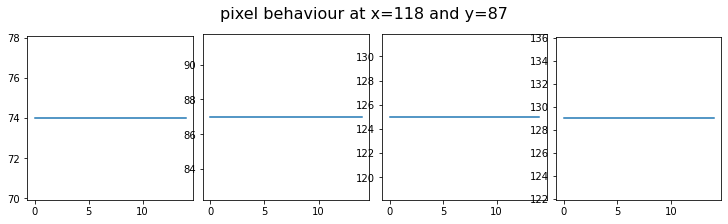

Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=17.0, mu2=17.0))
Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=19.0, mu2=19.0))
Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=9.0, mu2=9.0))
Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=68.0, mu2=68.0))


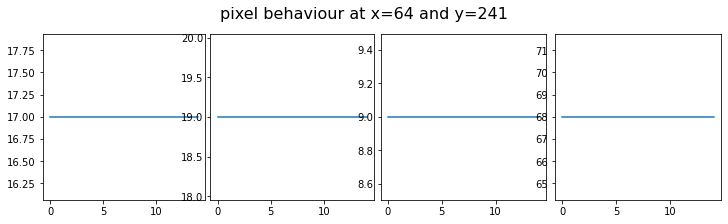

Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=29.0, mu2=29.0))
Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=28.0, mu2=28.0))
Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=15.0, mu2=15.0))
Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=84.0, mu2=84.0))


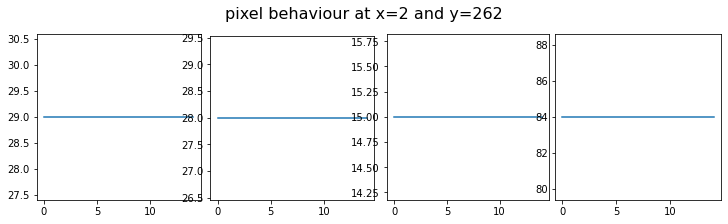

Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=100.0, mu2=100.0))
Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=121.0, mu2=121.0))
Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=149.0, mu2=149.0))
Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=127.0, mu2=127.0))


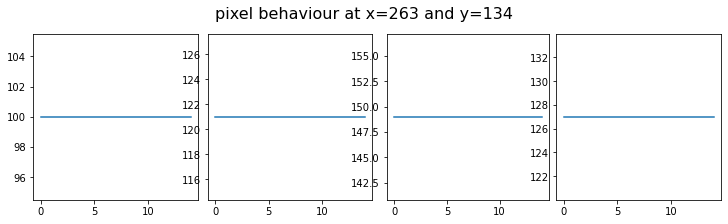

Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=106.0, mu2=106.0))
Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=129.0, mu2=129.0))
Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=160.0, mu2=160.0))
Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=140.0, mu2=140.0))


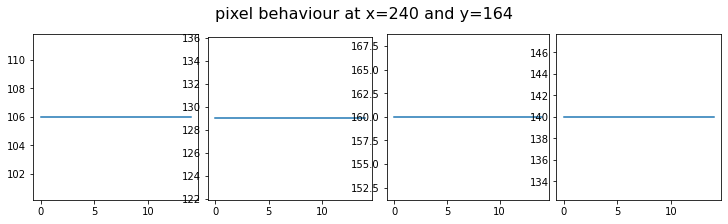

Pettitt_Test(h=False, cp=1, p=1.0, U=7.0, avg=mean(mu1=46.0, mu2=51.5))
Pettitt_Test(h=False, cp=1, p=1.0, U=7.0, avg=mean(mu1=44.0, mu2=47.5))
Pettitt_Test(h=False, cp=1, p=1.0, U=7.0, avg=mean(mu1=52.0, mu2=53.0))
Pettitt_Test(h=False, cp=1, p=1.0, U=7.0, avg=mean(mu1=77.0, mu2=67.0))


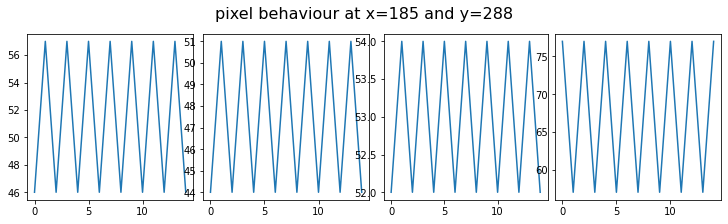

Pettitt_Test(h=True, cp=7, p=0.0, U=56.0, avg=mean(mu1=16.0, mu2=177.0))
Pettitt_Test(h=True, cp=7, p=0.0, U=56.0, avg=mean(mu1=13.0, mu2=195.0))
Pettitt_Test(h=True, cp=7, p=0.0, U=56.0, avg=mean(mu1=12.0, mu2=231.0))
Pettitt_Test(h=True, cp=7, p=0.0, U=56.0, avg=mean(mu1=41.0, mu2=206.0))


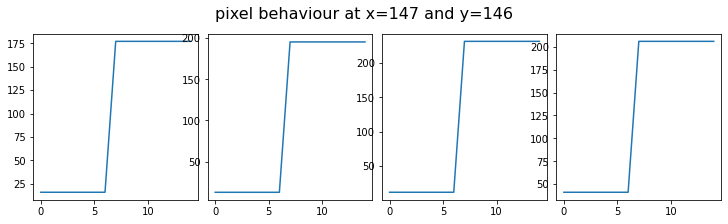

Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=85.0, mu2=85.0))
Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=85.0, mu2=85.0))
Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=77.0, mu2=77.0))
Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=67.0, mu2=67.0))


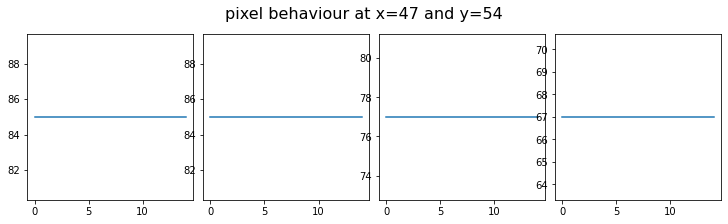

Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=75.0, mu2=75.0))
Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=96.0, mu2=96.0))
Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=123.0, mu2=123.0))
Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=108.0, mu2=108.0))


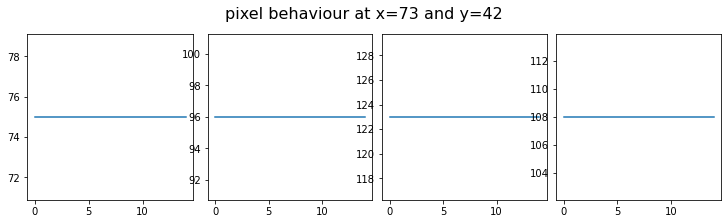

Pettitt_Test(h=True, cp=7, p=0.0, U=56.0, avg=mean(mu1=17.0, mu2=83.0))
Pettitt_Test(h=True, cp=7, p=0.0, U=56.0, avg=mean(mu1=14.0, mu2=87.0))
Pettitt_Test(h=True, cp=7, p=0.0, U=56.0, avg=mean(mu1=13.0, mu2=112.0))
Pettitt_Test(h=True, cp=7, p=0.0, U=56.0, avg=mean(mu1=40.0, mu2=108.0))


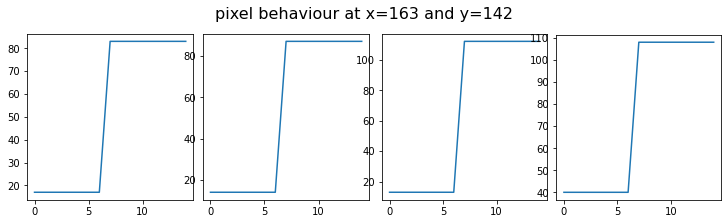

Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=42.0, mu2=42.0))
Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=49.0, mu2=49.0))
Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=72.0, mu2=72.0))
Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=74.0, mu2=74.0))


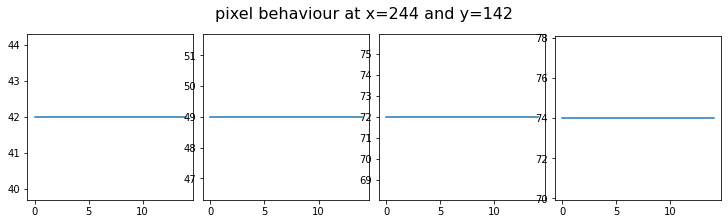

Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=21.0, mu2=21.0))
Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=13.0, mu2=13.0))
Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=11.0, mu2=11.0))
Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=41.0, mu2=41.0))


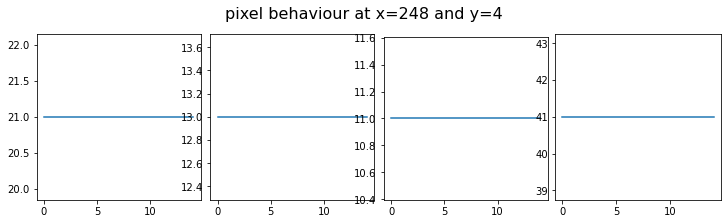

Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=44.0, mu2=44.0))
Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=35.0, mu2=35.0))
Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=18.0, mu2=18.0))
Pettitt_Test(h=False, cp=1, p=1.0, U=0.0, avg=mean(mu1=9.0, mu2=9.0))


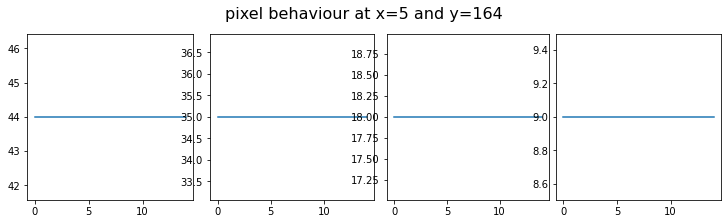

In [0]:
for i in range(20):
    print_random_hg(simule)

In [0]:
dif_var_ent.shape

(90000, 64)

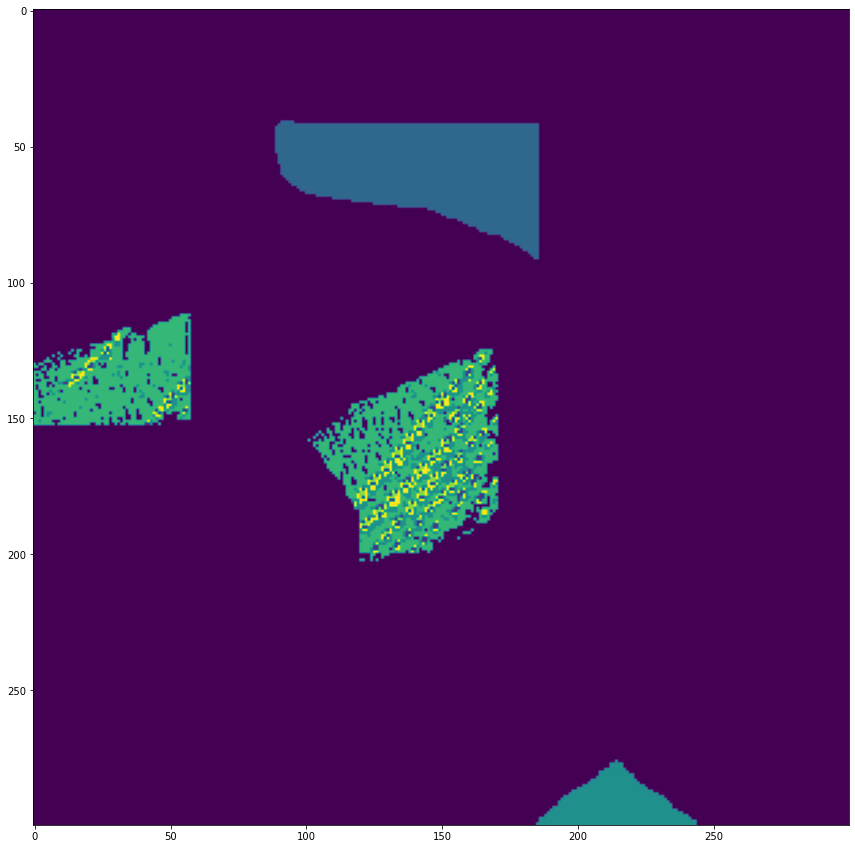

In [0]:
var_ent = np.concatenate([FVS_entropie, FVS_variance], axis=1)
cluster_map, _, _ = clustering(var_ent, simule.shape, components=7)
plt.imshow(cluster_map)

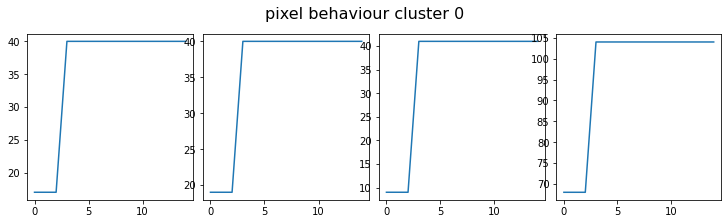

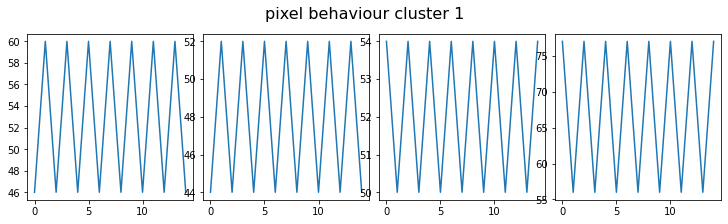

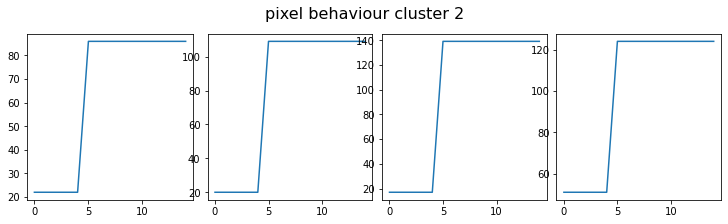

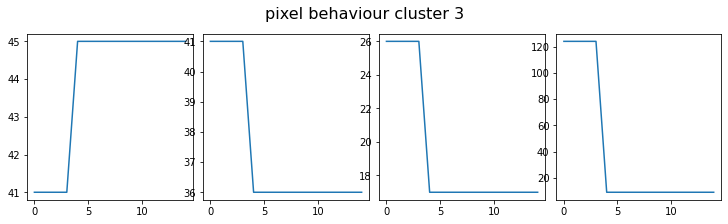

In [53]:
for i in range(4) :
    print_selected_cluster(simule, entr_map, i)

### Map entropy map clusters

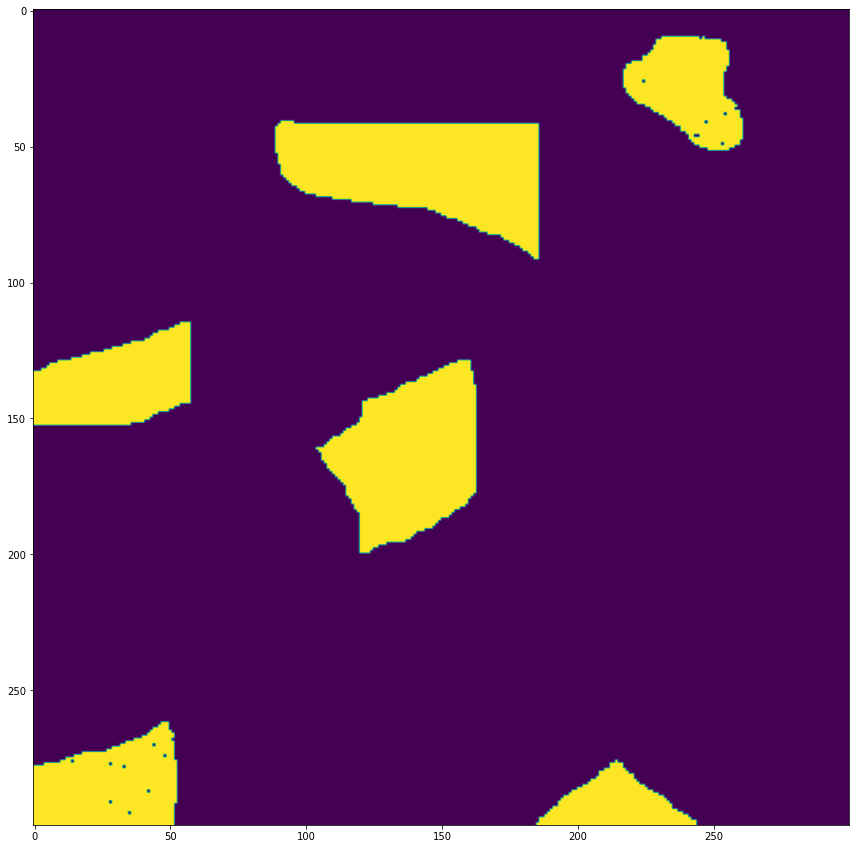

In [54]:
# 0 : stable or periodic, 2 : sudden

mapped_clusters = {0:2, 1:0, 2:2, 3:2}

entr_filtered_map = np.vectorize(mapped_clusters.get)(entr_map)

plt.imshow(entr_filtered_map)

### Merging the differences-variation and the entropy clusters

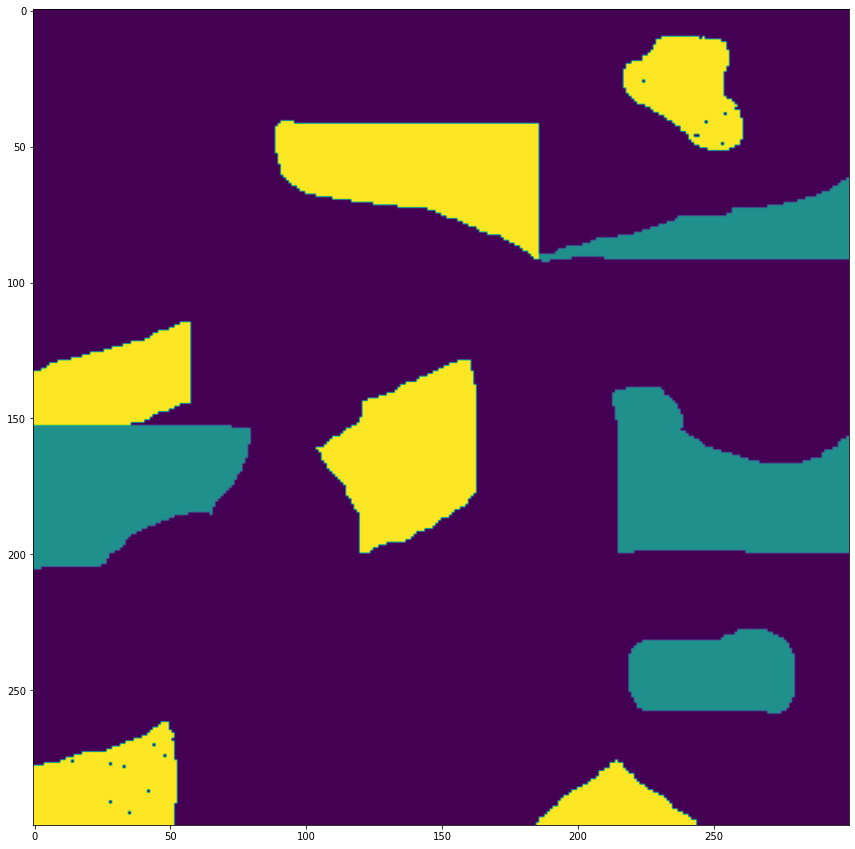

In [55]:
merged_map = np.zeros(cluster_map.shape)

merged_map[dif_var_map == 0] = 0
merged_map[dif_var_map == 1] = 1
merged_map[entr_filtered_map == 2] = 2

plt.imshow(merged_map)

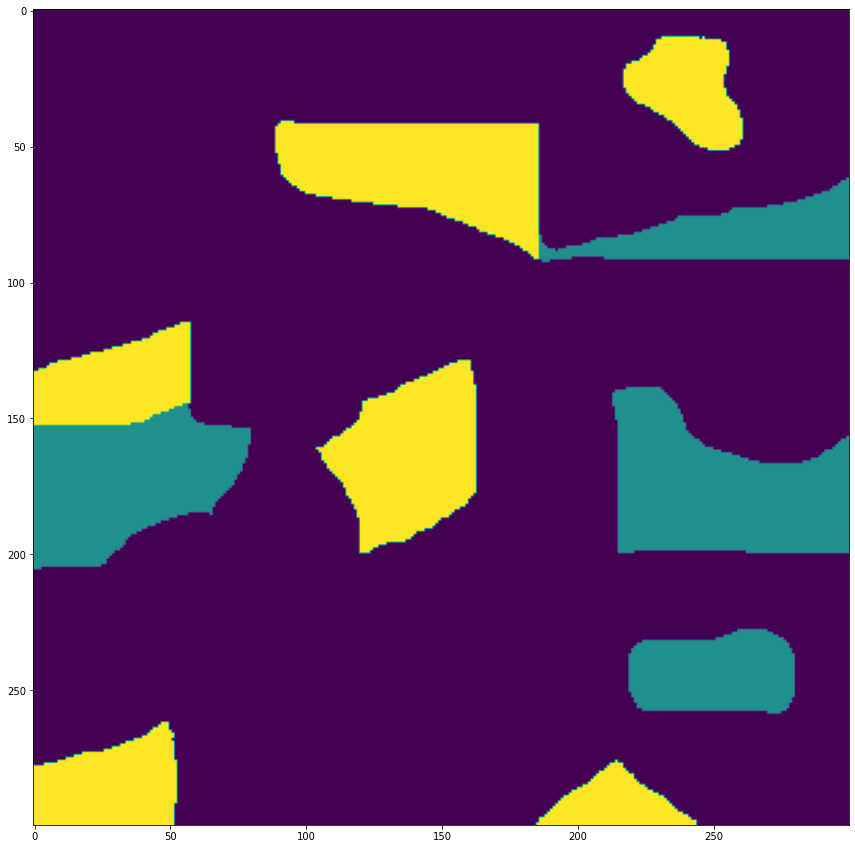

In [56]:
kernel = skimage.morphology.disk(6)
merged_map_filtered = cv2.morphologyEx(merged_map, cv2.MORPH_CLOSE, kernel)
plt.imshow(merged_map_filtered)

### Trying mean clustering

In [0]:
def find_vector_set_mean(img):
    dims = img.shape
    vector_set = np.zeros((dims[1]*dims[2], dims[0]*dims[3]))
    for i in range(dims[1]) :
        for j in range(dims[2]) :
            for l in range(dims[0]) :
                for k in range (dims[3]) :
                    block   = img[l, i:i+5, j:j+5, k]
                    feature = block.ravel()
                    vector_set[i*dims[2]+j , l*dims[3]+k] = np.mean(feature) 
                
    return vector_set

In [0]:
difs_mean = find_vector_set_mean(difs)
variance_mean = find_vector_set_mean(np.expand_dims(variance, axis=0))
entropie_mean = find_vector_set_mean(np.expand_dims(entropie, axis=0))
difs_var_ent_mean = np.concatenate([difs_mean, variance_mean, entropie_mean], axis=1)

NameError: name 'entropie' is not defined

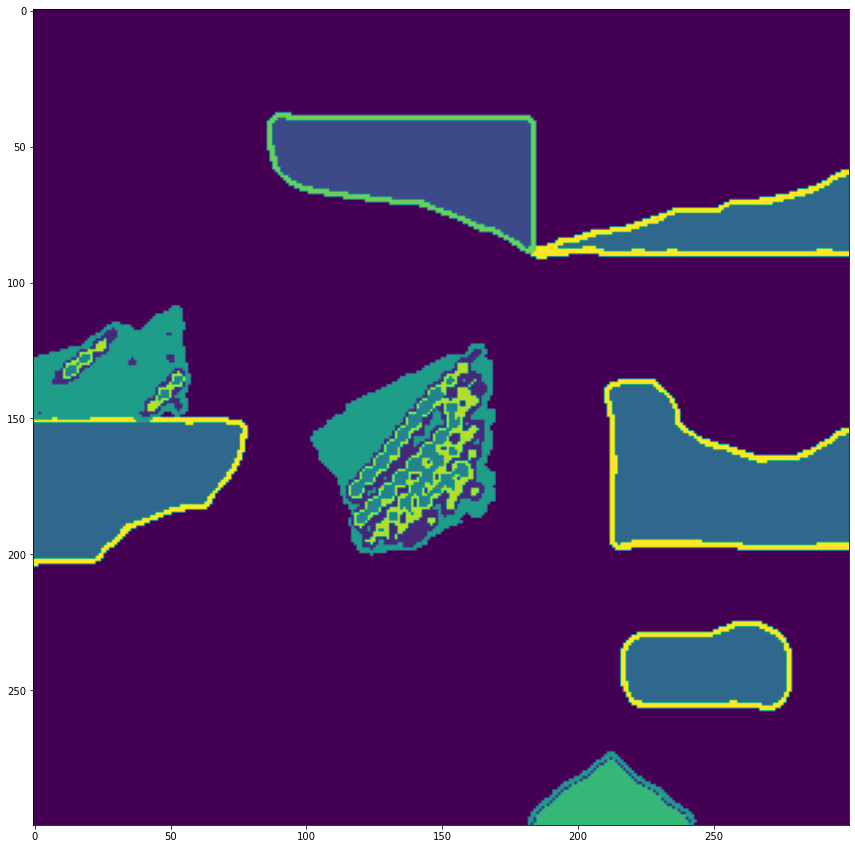

In [0]:
#dif = np.concatenate([dif_var, FVS_entropie], axis=1)
#entropie_mean
cluster_map = clustering(difs_var_ent_mean, simule.shape, components=10)
plt.imshow(cluster_map)

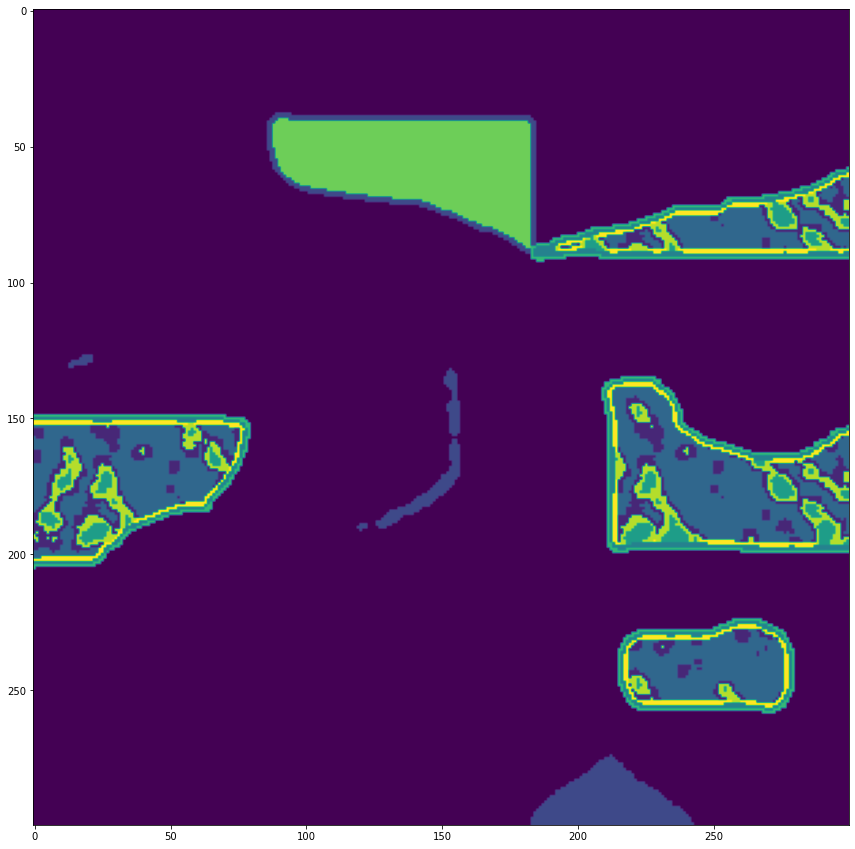

In [0]:
cluster_map, _, _ = clustering(difs_mean, simule.shape, components=10)
plt.imshow(cluster_map)

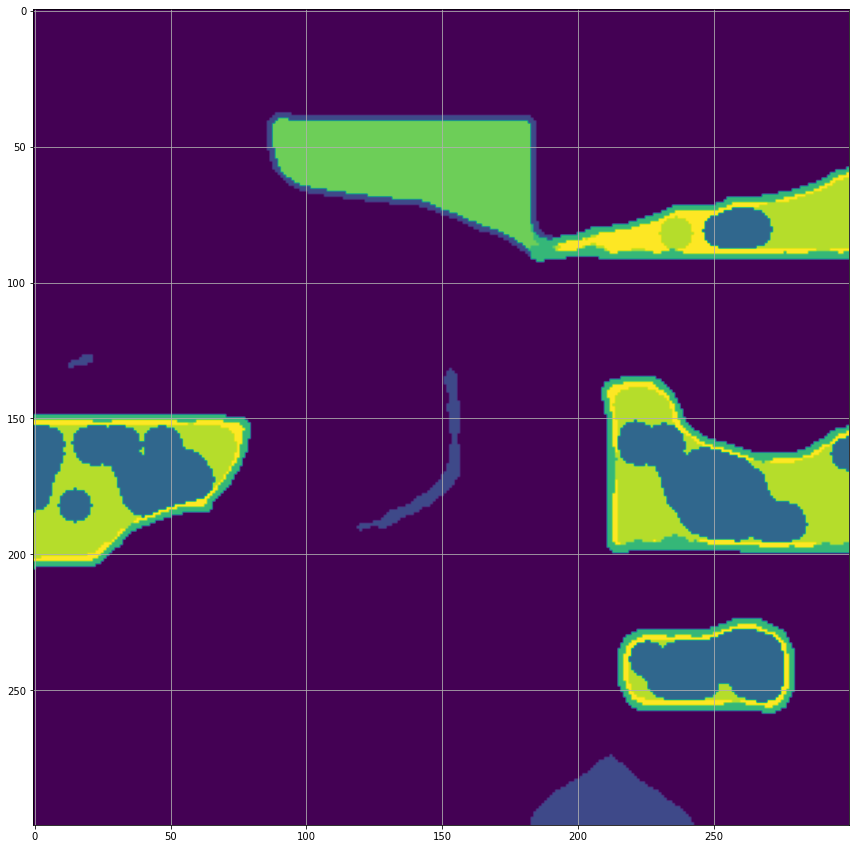

In [0]:
kernel = skimage.morphology.disk(6)
cluster_map = cv2.morphologyEx(cluster_map, cv2.MORPH_CLOSE, kernel)
plt.grid()
plt.imshow(cluster_map)

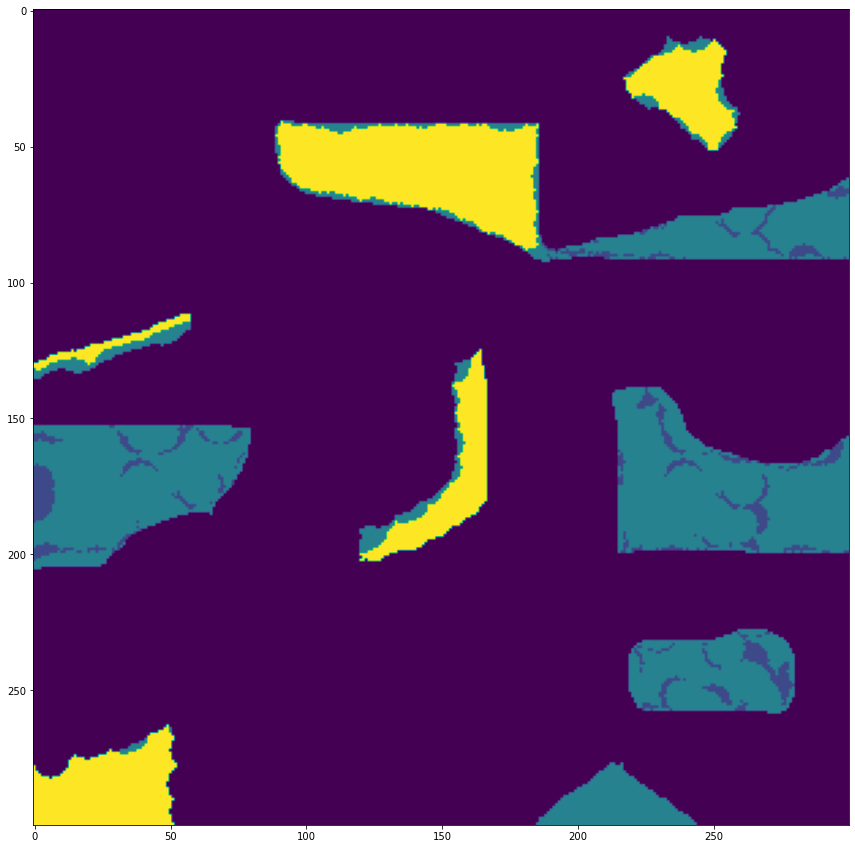

In [0]:
cluster_map[cluster_map == 5] = 1
cluster_map[cluster_map == 6] = 1
cluster_map[cluster_map == 3] = 1
cluster_map[cluster_map == 4] = 1

cluster_map[cluster_map == 7] = 3
cluster_map[cluster_map ==8] = 3
cluster_map[cluster_map ==9] = 3

plt.imshow(cluster_map)

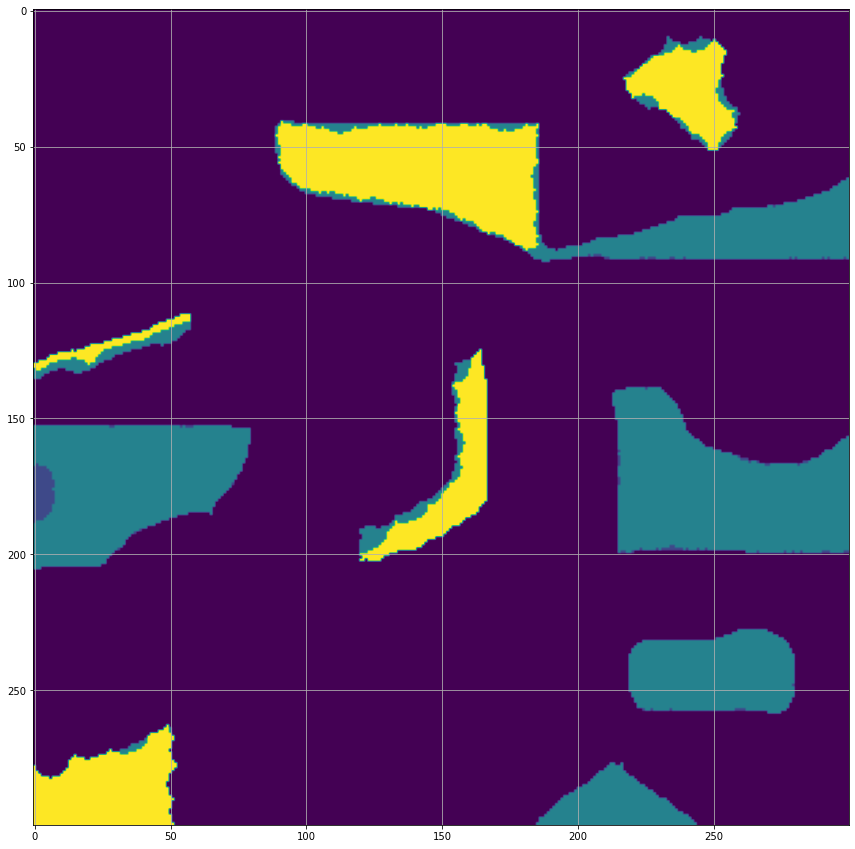

In [0]:
kernel = skimage.morphology.disk(6)
cluster_map = cv2.morphologyEx(cluster_map, cv2.MORPH_CLOSE, kernel)
plt.grid()
plt.imshow(cluster_map)

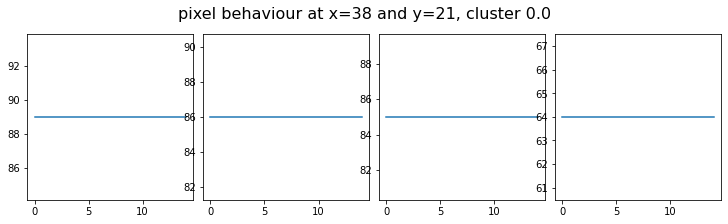

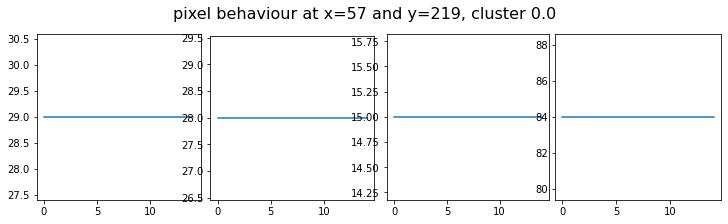

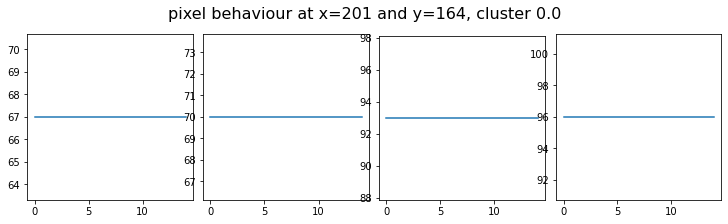

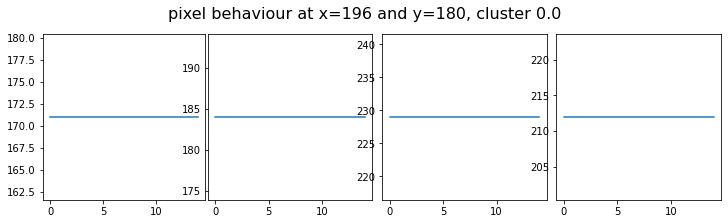

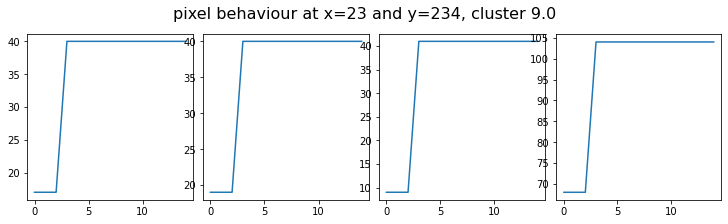

...

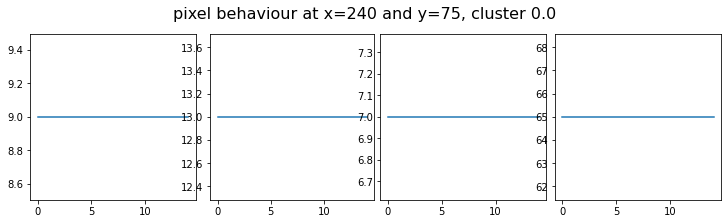

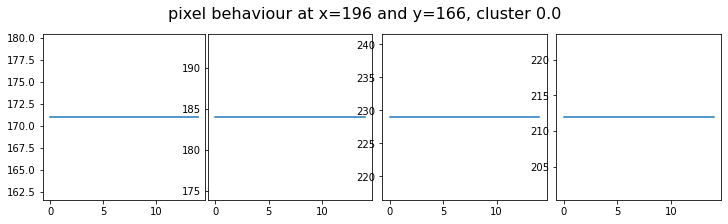

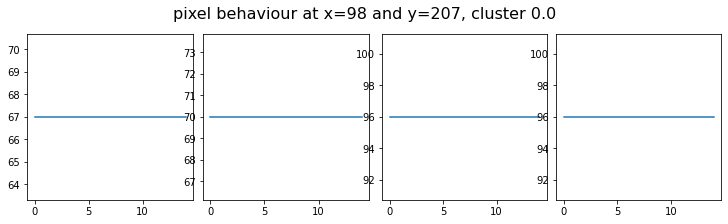

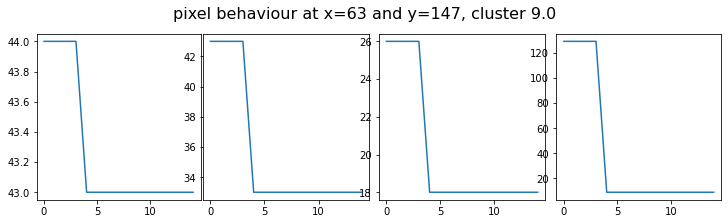

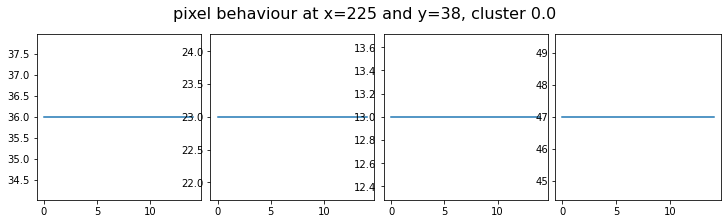

In [0]:
for i in range(20) :
    print_random_cluster(simule, cluster_map)

### Plotting Clusters

In [0]:
from sklearn.manifold import TSNE
from mpl_toolkits.mplot3d import Axes3D

def visualize_clusters(img, components) :
    img_vectors = find_vector_set(img)
    img_embedded = TSNE(n_components=components).fit_transform(img_vectors)
    fig = plt.figure()
    ax = Axes3D(fig)
    ax.scatter(img_embedded[:10000, 0], img_embedded[:10000, 1], img_embedded[:10000, 2])
    plt.show()
    return img_embedded

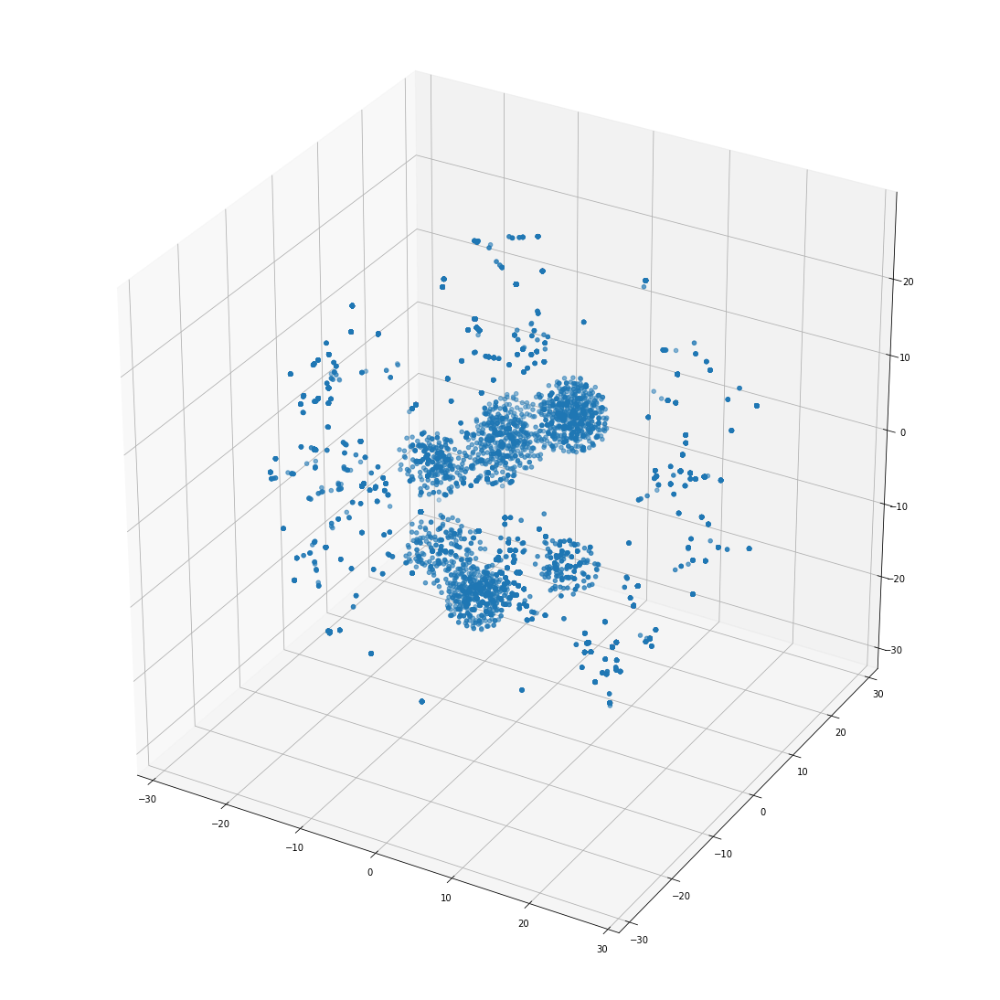

In [0]:
visualize_clusters(simule, 3)

In [0]:
difs_embedded = visualize_clusters(difs, 3)

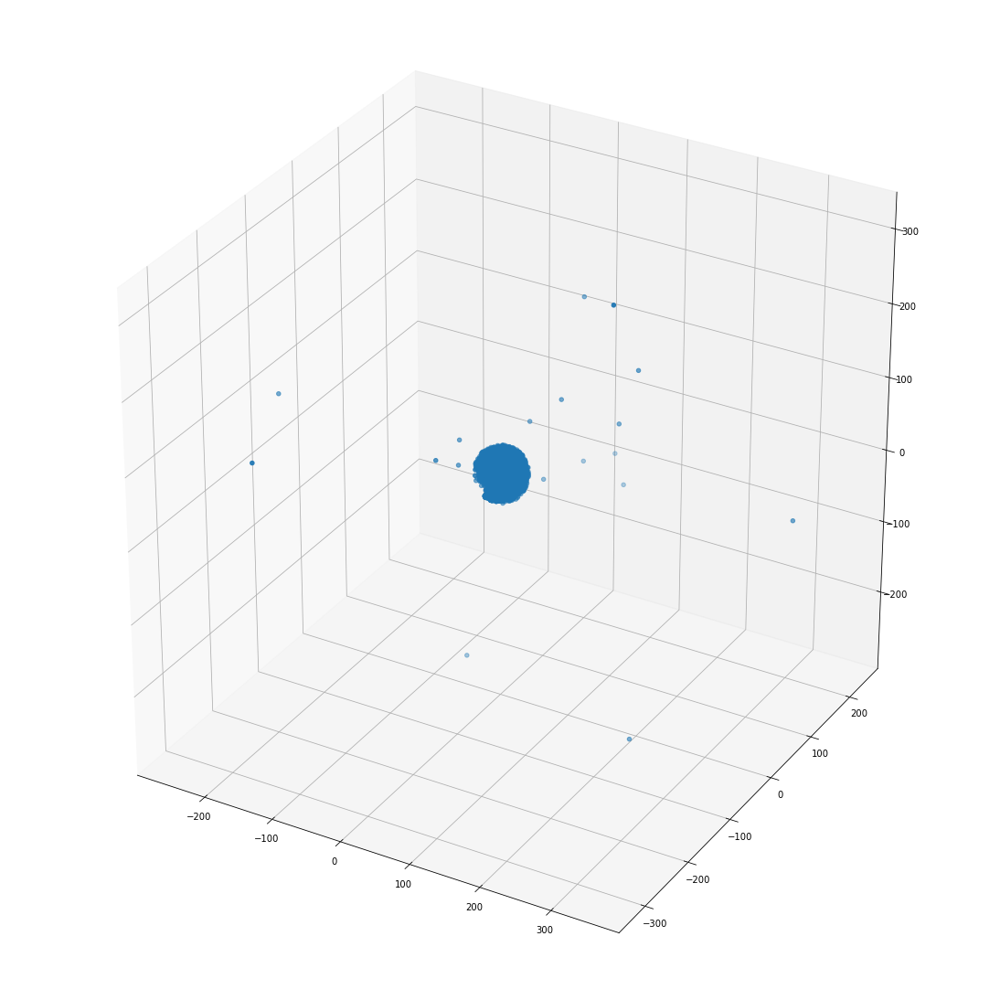

In [0]:
fig = plt.figure()
ax = Axes3D(fig)
ax.scatter(difs_embedded[:10000, 0], difs_embedded[:10000, 1], difs_embedded[:10000, 2])
plt.show()

# Sequential Model

In [0]:
dims = simule.shape
X = np.transpose(simule, (1, 2, 0, 3))
X = X.reshape((dims[1]*dims[2], dims[0], dims[3]))
y = merged_map_filtered.reshape((dims[1]*dims[2], 1))

In [96]:
unique, counts = np.unique(y, return_counts=True)
print (np.asarray((unique, counts)).T.astype(int))

[[    0 68939]
 [    1 10188]
 [    2 10873]]


In [83]:
from keras.utils.np_utils import to_categorical   
y_cat = to_categorical(y, num_classes=3)

Using TensorFlow backend.


In [0]:
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X, y_cat, test_size = 0.2, random_state = 123, stratify=y)

In [85]:
X_train.shape, y_train.shape

((72000, 15, 4), (72000, 3))

In [95]:
y_val[y_val[:, 0]==1].shape

(13788, 3)

In [0]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Flatten, Embedding, Input, Dropout

In [0]:
model_LSTM = Sequential()
model_LSTM.add(Input(shape=(15, 4)))
model_LSTM.add(LSTM(16, input_shape=(15, 4), return_sequences=True))
model_LSTM.add(LSTM(16, dropout=0.2, recurrent_dropout=0.2))
model_LSTM.add(Flatten())
model_LSTM.add(Dense(32, activation='relu'))
model_LSTM.add(Dropout(0.3))
model_LSTM.add(Dense(16, activation='relu'))
model_LSTM.add(Dropout(0.5))
model_LSTM.add(Dense(3, activation='softmax'))


In [103]:
model_LSTM.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy', 'AUC'])
model_LSTM.summary()

Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_11 (LSTM)               (None, 15, 16)            1344      
_________________________________________________________________
lstm_12 (LSTM)               (None, 16)                2112      
_________________________________________________________________
flatten_4 (Flatten)          (None, 16)                0         
_________________________________________________________________
dense_8 (Dense)              (None, 32)                544       
_________________________________________________________________
dropout_4 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_9 (Dense)              (None, 16)                528       
_________________________________________________________________
dropout_5 (Dropout)          (None, 16)               

In [104]:
hist_LSTM = model_LSTM.fit(X_train, y_train,
                         batch_size=32,
                         epochs=6,
                         validation_data=(X_val, y_val))

Epoch 1/6
2250/2250 [==============================] - 29s 13ms/step - loss: 0.1470 - accuracy: 0.9454 - auc: 0.9942 - val_loss: 0.0415 - val_accuracy: 0.9904 - val_auc: 0.9990
Epoch 2/6
2250/2250 [==============================] - 29s 13ms/step - loss: 0.0478 - accuracy: 0.9802 - auc: 0.9988 - val_loss: 0.0232 - val_accuracy: 0.9969 - val_auc: 0.9992
Epoch 3/6
2250/2250 [==============================] - 29s 13ms/step - loss: 0.0469 - accuracy: 0.9819 - auc: 0.9988 - val_loss: 0.0199 - val_accuracy: 0.9974 - val_auc: 0.9991
Epoch 4/6
2250/2250 [==============================] - 29s 13ms/step - loss: 0.0382 - accuracy: 0.9839 - auc: 0.9991 - val_loss: 0.0202 - val_accuracy: 0.9977 - val_auc: 0.9992
Epoch 5/6
2250/2250 [==============================] - 29s 13ms/step - loss: 0.0398 - accuracy: 0.9833 - auc: 0.9991 - val_loss: 0.0177 - val_accuracy: 0.9978 - val_auc: 0.9991
Epoch 6/6
2250/2250 [==============================] - 28s 13ms/step - loss: 0.0364 - accuracy: 0.9846 - auc: 0.999

### Clustering aggregation function

# Testing on real data

In [6]:
RadioImg1.shape

(5, 501, 501, 4)

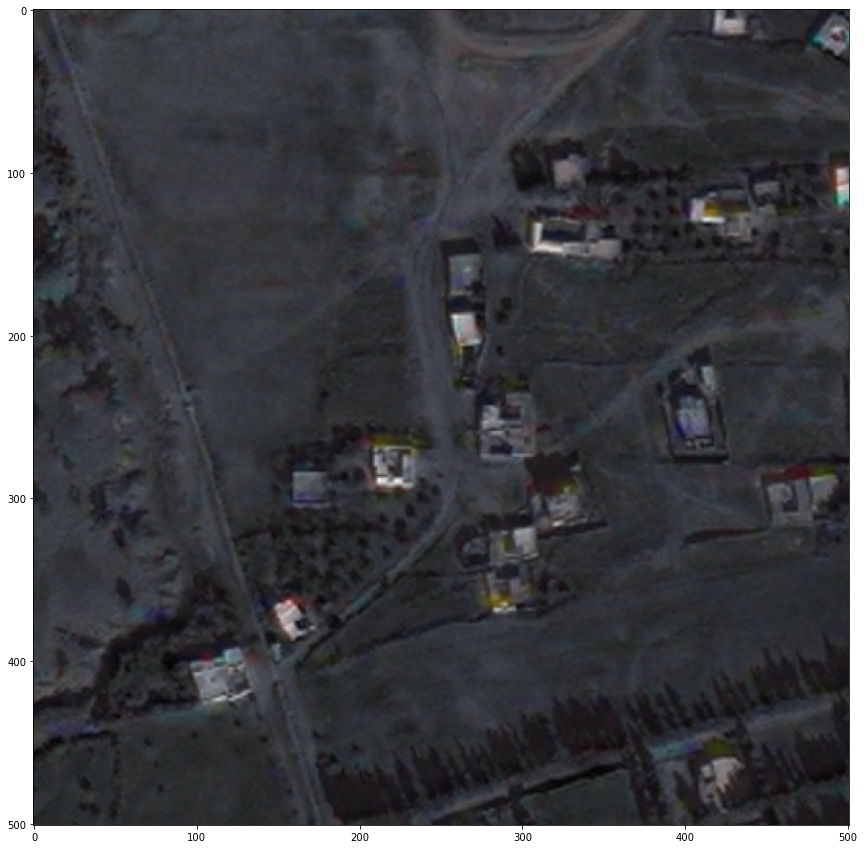

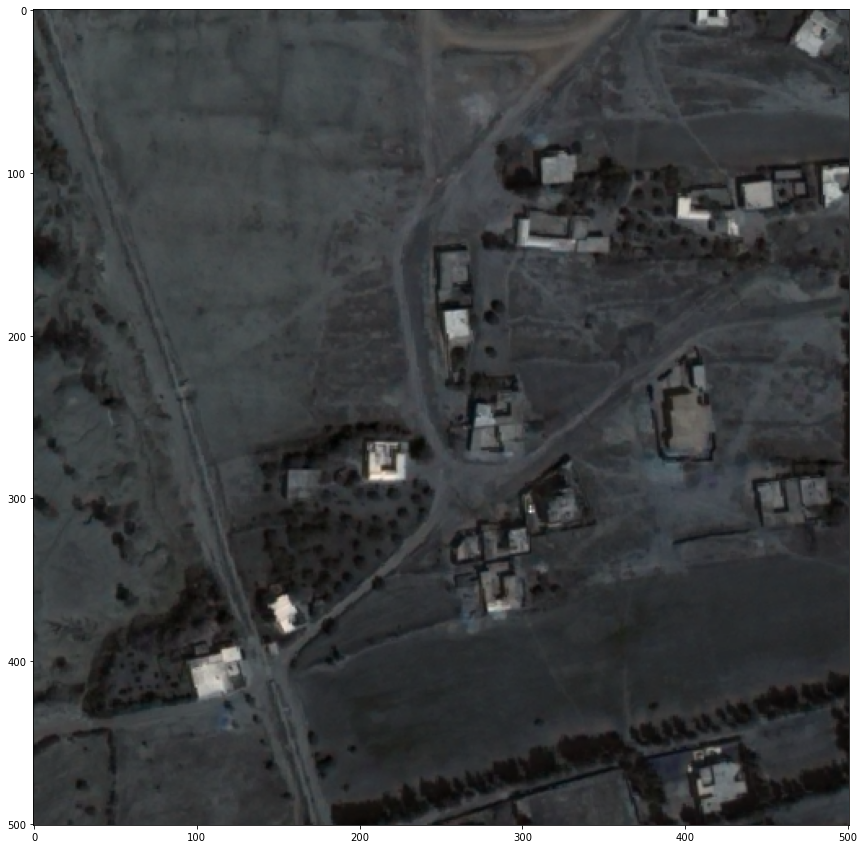

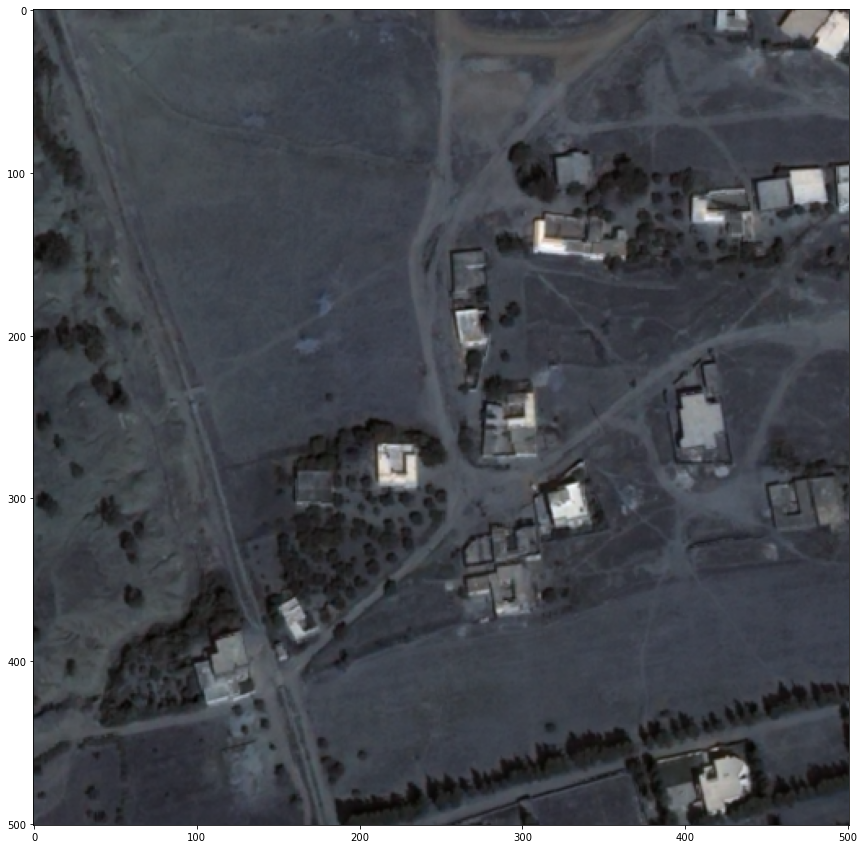

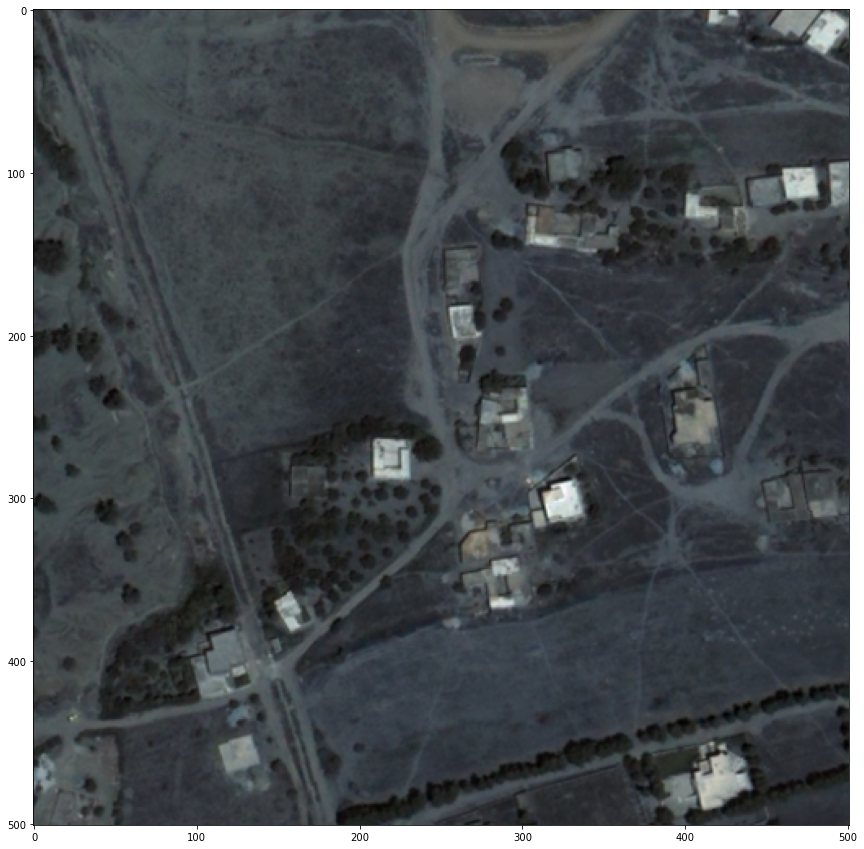

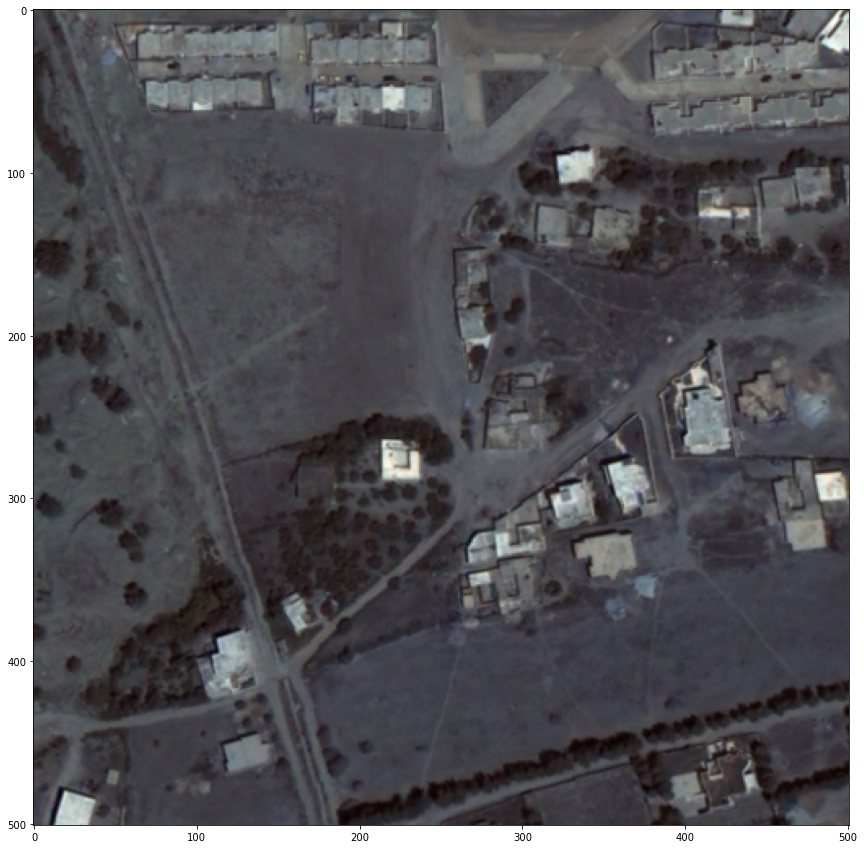

In [25]:
for i in range(5) :
  plt.figure()
  plt.imshow(RadioImg3[i, :, :, :3])

In [31]:
SampleImg = RadioImg3[:, :, :, :]
SampleImg.shape

(5, 501, 501, 4)

IndexError: ignored

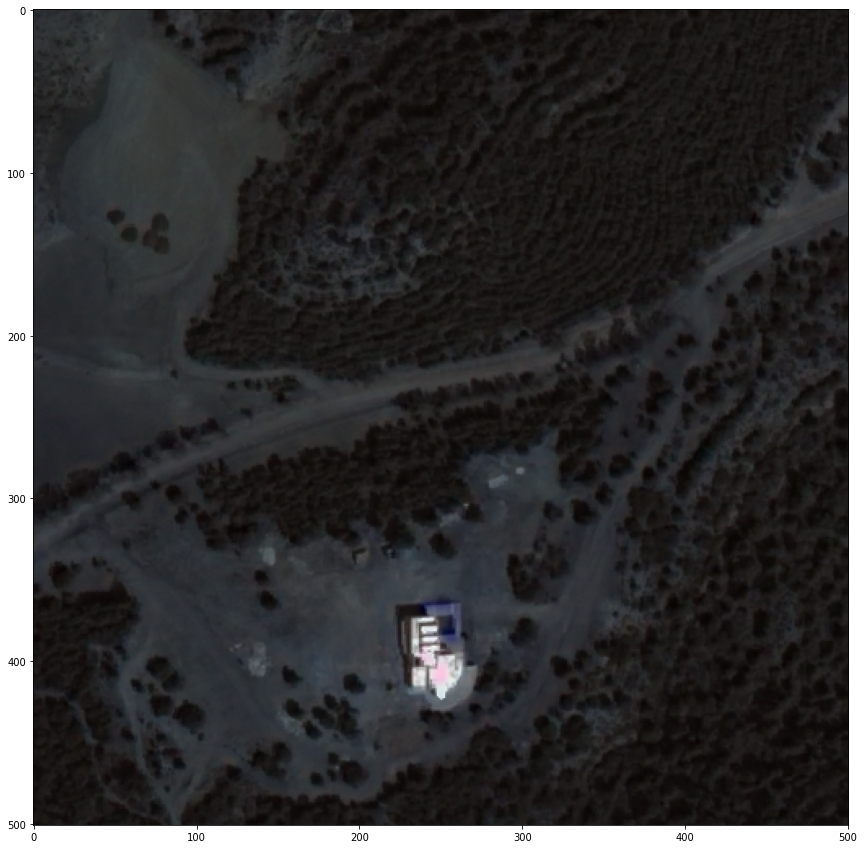

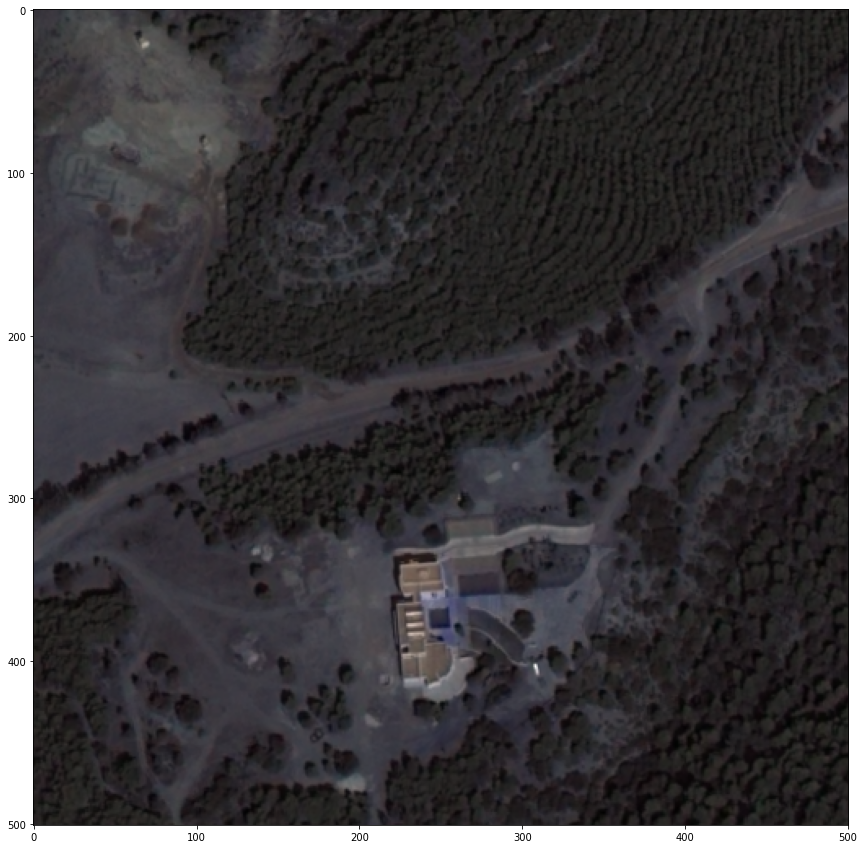

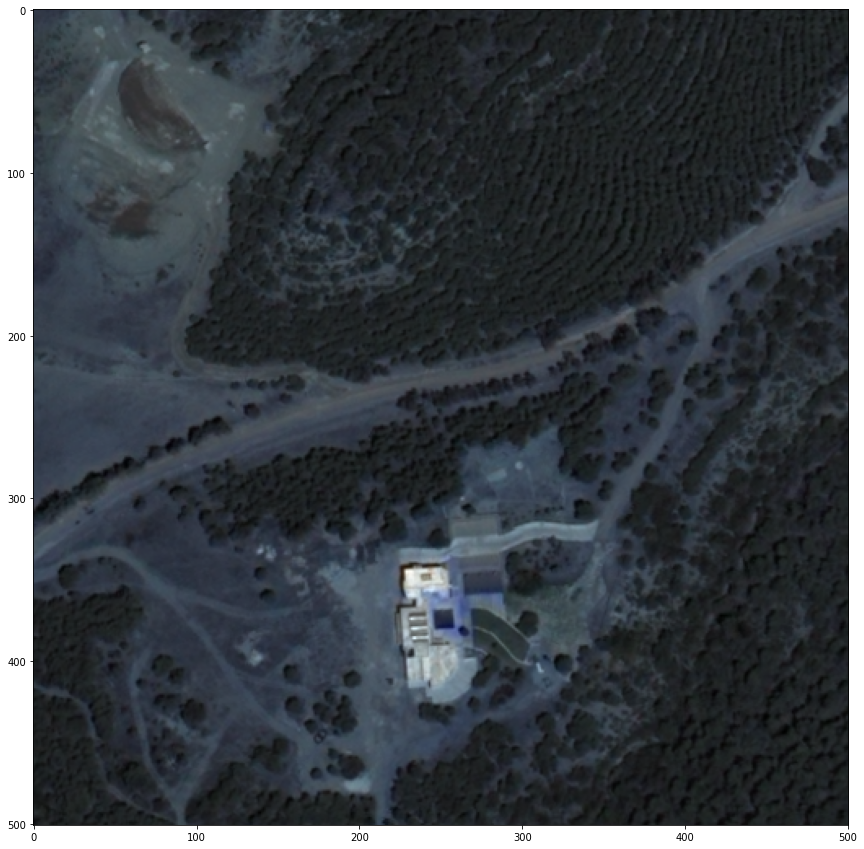

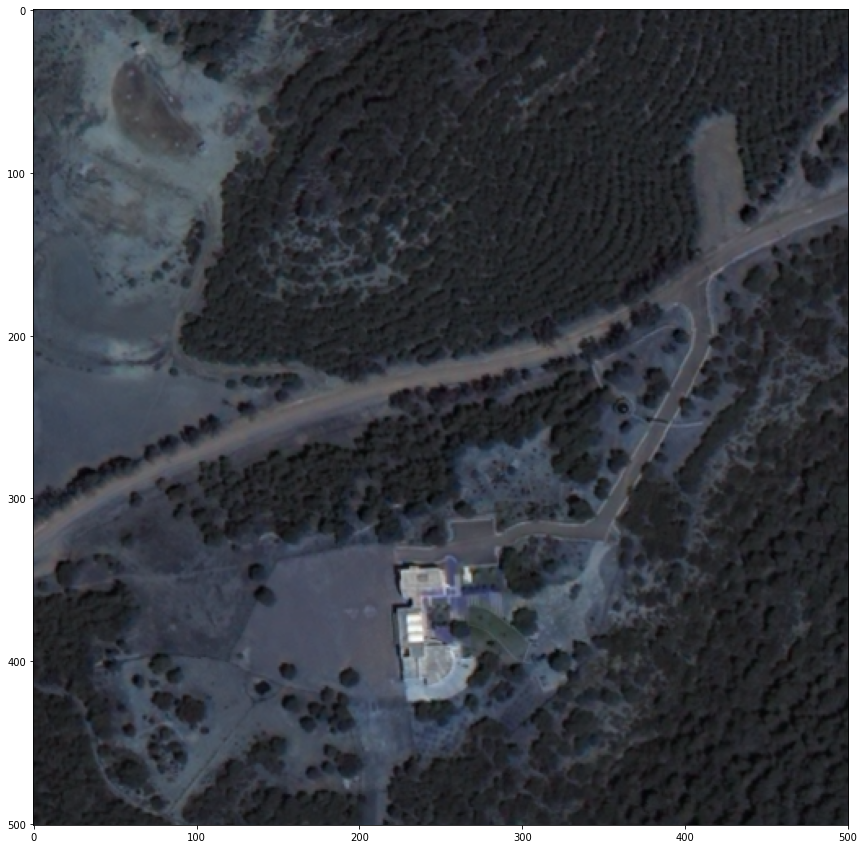

<Figure size 1080x1080 with 0 Axes>

In [119]:
for i in range(4) :
  plt.figure()
  plt.imshow(SampleImg[i, :, :, :3])

### Difference - Variance

In [32]:
difs = get_dif_img(SampleImg)
variance = get_variance(SampleImg)
FVS = find_vector_set(difs)
FVS_variance = find_vector_set(np.expand_dims(variance, axis=0))
dif_var = np.concatenate([FVS, FVS_variance], axis=1)

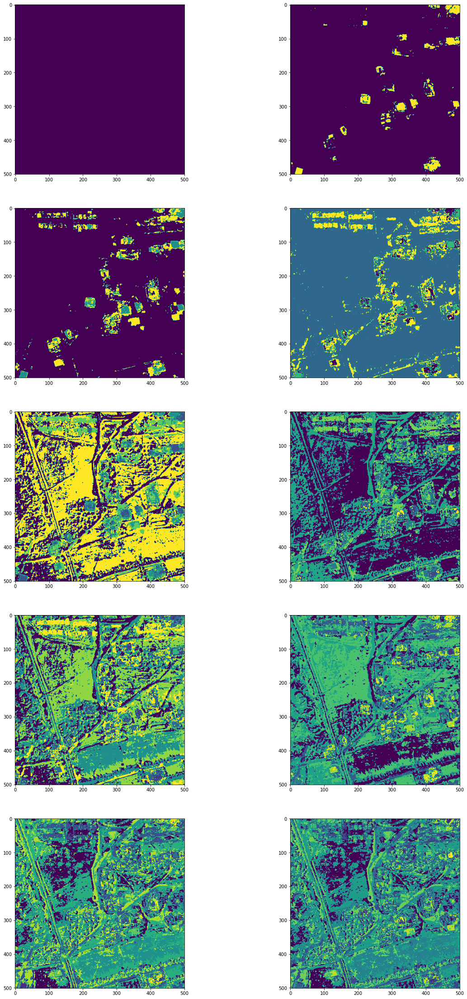

In [33]:
plt.figure(figsize=(20,40))
for i in range(10) :
  plt.subplot(5, 2, i+1)
  cluster_map, _, _ = clustering(dif_var, SampleImg.shape, components=i+1)
  plt.imshow(cluster_map)

In [34]:
cluster_map, _, _ = clustering(dif_var, SampleImg.shape, components=5)

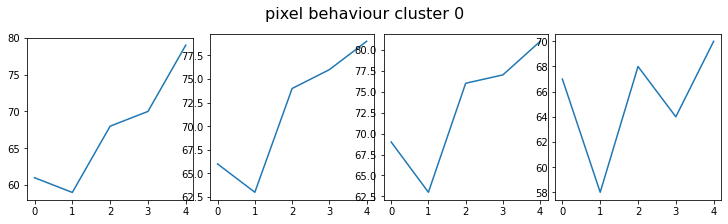

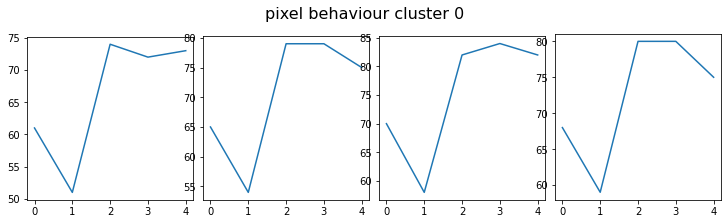

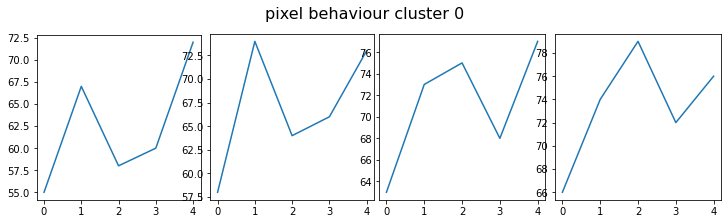

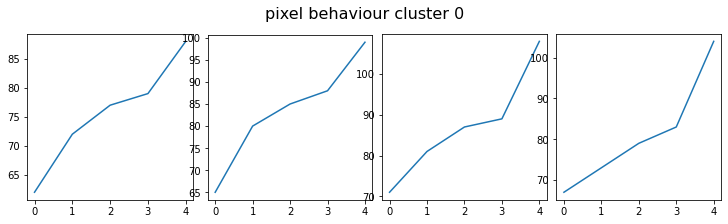

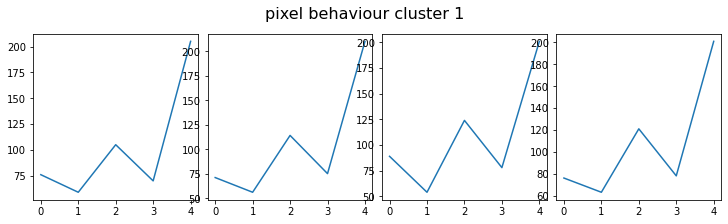

...

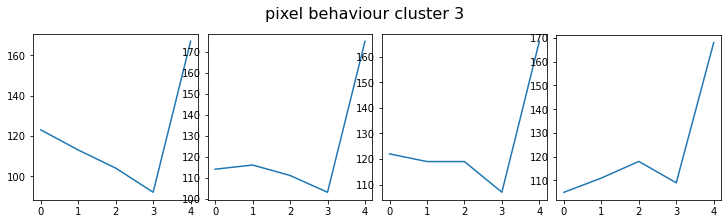

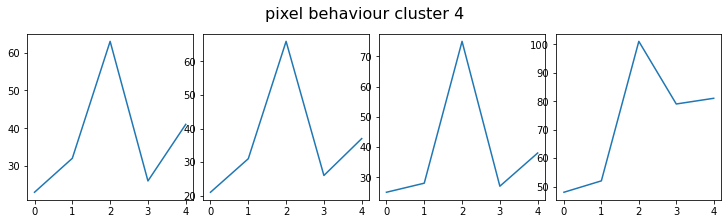

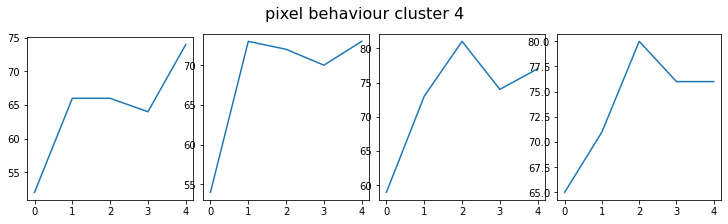

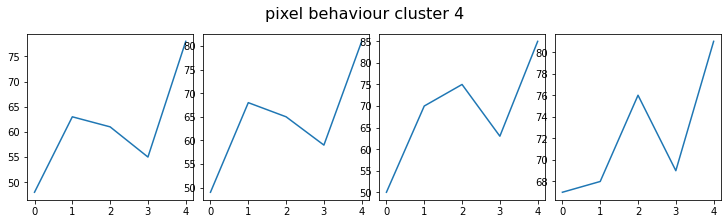

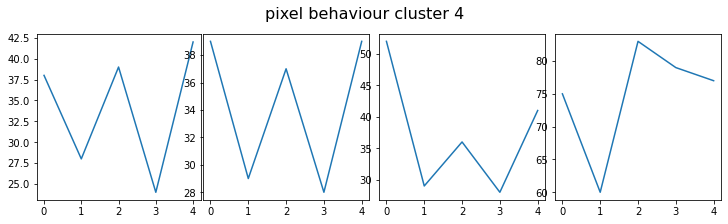

In [37]:
for i in range(5) :
    print_selected_cluster(SampleImg, cluster_map, i)
    print_selected_cluster(SampleImg, cluster_map, i)
    print_selected_cluster(SampleImg, cluster_map, i)
    print_selected_cluster(SampleImg, cluster_map, i)

In [36]:
unique, counts = np.unique(cluster_map, return_counts=True)
print (np.asarray((unique, counts)).T.astype(int))

[[     0  83287]
 [     1   3545]
 [     2   7404]
 [     3  26692]
 [     4 130073]]


### Entropy

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: RuntimeWarning: overflow encountered in ubyte_scalars
  after removing the cwd from sys.path.


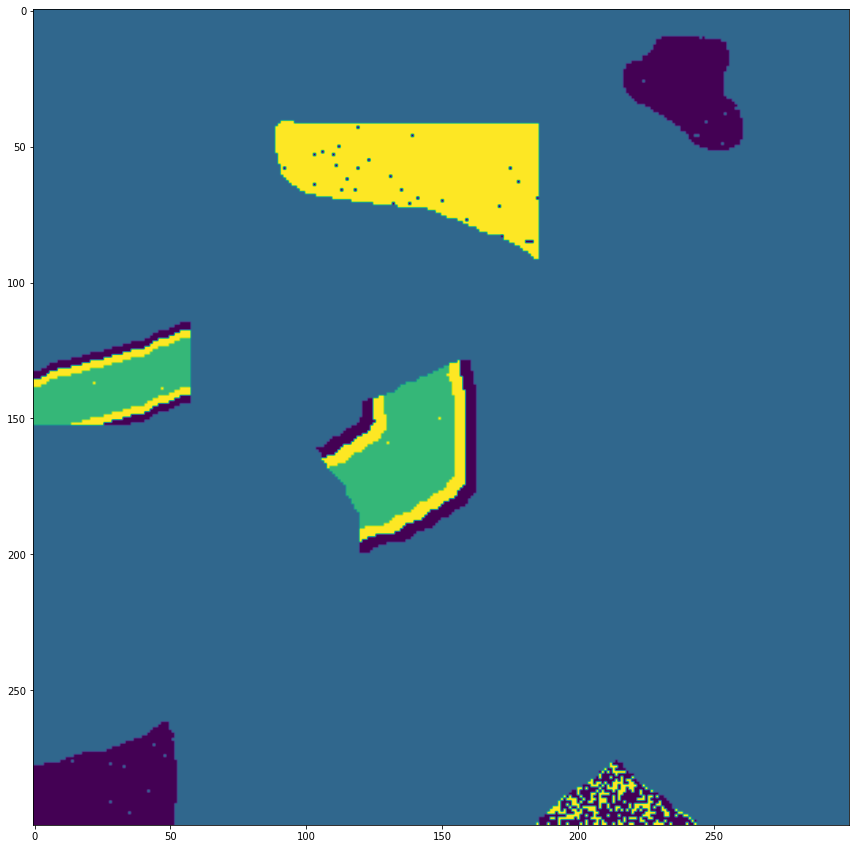

In [129]:
entropie = get_entropy(simule)
FVS_entropie = find_vector_set(np.expand_dims(entropie, axis=0))

In [0]:
import pickle as pkl
pkl.dump(entropie, open( "entropieImg1.p", "wb" ))

In [0]:
import pickle as pkl
entropie = pkl.load(open("entropieImg1.p", "rb" ))

In [0]:
cluster_map, _, _ = clustering(FVS_entropie, simule.shape, components=4)
plt.imshow(cluster_map)

In [0]:
for i in range(5) :
  print_selected_cluster(SampleImg, cluster_map, i)

In [0]:
unique, counts = np.unique(cluster_map, return_counts=True)
print (np.asarray((unique, counts)).T.astype(int))

In [0]:
def find_vector_set(diff_image, new_size):
 
    i = 0
    j = 0
    vector_set = np.zeros((int(new_size[0] * new_size[1] / 25),25))
    while i < vector_set.shape[0]:
        while j < new_size[1]:
            k = 0
            while k < new_size[0]:
                block   = diff_image[j:j+5, k:k+5]
                feature = block.ravel()
                vector_set[i, 🙂 = feature
                k = k + 5
            j = j + 5
        i = i + 1
 
    mean_vec   = np.mean(vector_set, axis = 0)
    # Mean normalization
    vector_set = vector_set - mean_vec   
    return vector_set, mean_vec

In [0]:
def find_FVS(EVS, diff_image, mean_vec, new):
 
    i = 2
    feature_vector_set = []
 
    while i < new[1] - 2:
        j = 2
        while j < new[0] - 2:
            block = diff_image[i-2:i+3, j-2:j+3]
            feature = block.flatten()
            feature_vector_set.append(feature)
            j = j+1
        i = i+1
 
    FVS = np.dot(feature_vector_set, EVS)
    FVS = FVS - mean_vec
    print ("Feature vector space size", FVS.shape)
    return FVS

In [0]:
def clustering(FVS, components, new):
    kmeans = KMeans(components, verbose = 0)
    kmeans.fit(FVS)
    output = kmeans.predict(FVS)
    count  = Counter(output)
 
    least_index = min(count, key = count.get)
    change_map  = np.reshape(output,(new[1] - 4, new[0] - 4))
    return least_index, change_map

In [0]:
# Read Images
print(' Reading Images ...')
start = time.time()
image1 = img00
image2 = img04
end = time.time()

In [0]:
# Resize Images
start = time.time()
new_size = np.asarray(image1.shape) /5
new_size = new_size.astype(int) *5
image1 = cv2.resize(image1, (new_size[0],new_size[1])).astype(int)
image2 = cv2.resize(image2, (new_size[0],new_size[1])).astype(int)
end = time.time()

In [0]:
# Difference Image

diff_image = abs(image1 - image2)

#cv2.imwrite(out_dir+'difference.jpg', diff_image)
plt.figure()

plt.imshow(diff_image)

diff_image=diff_image[:,:,1]

In [0]:
pca = PCA()
vector_set, mean_vec=find_vector_set(diff_image, new_size)
pca.fit(vector_set)
EVS = pca.components_

In [0]:
FVS = find_FVS(EVS, diff_image, mean_vec, new_size)

In [0]:
components = 3

least_index, change_map = clustering(FVS, components, new_size)

change_map[change_map == least_index] = 255
change_map[change_map != 255] = 0
change_map = change_map.astype(np.uint8)

#cv2.imwrite(out_dir+'ChangeMap.jpg', change_map)
plt.figure()

plt.imshow(change_map)

In [0]:
plt.figure()
kernel = skimage.morphology.disk(6)
CloseMap = cv2.morphologyEx(change_map, cv2.MORPH_CLOSE, kernel)
#cv2.imwrite(out_dir+'CloseMap.jpg', CloseMap)
plt.imshow(CloseMap)
plt.figure()

OpenMap = cv2.morphologyEx(CloseMap, cv2.MORPH_OPEN, kernel)
#cv2.imwrite(out_dir+'OpenMap.jpg', OpenMap)
plt.imshow(OpenMap)
plt.figure()
print(' End Change Detection')